In [1]:
import json
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

from utils import (dotplots_and_ranking_most_significant_genes, visualize_p_value_adj, visualize_rank_genes_groups_violin,
    visualize_venn_diagram_ttest_vs_wilcoxon, volcano_plot)

RANDOM_STATE = 42

c:\Users\giuli\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
adata = sc.read('transcriptomic')

c:\Users\giuli\anaconda3\lib\site-packages\anndata\_core\anndata.py:1820: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



In [3]:
adata.var_names_make_unique()

c:\Users\giuli\anaconda3\lib\site-packages\anndata\utils.py:260: UserWarning:

Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['TBCE-1']



In [4]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [5]:
adata_CSF_MS = adata[(adata.obs['cell_type'] == 'CSF') & (adata.obs['MS/HC'] == 'MS')]
adata_PBMC_MS = adata[(adata.obs['cell_type'] == 'PBMC') & (adata.obs['MS/HC'] == 'MS')]

adata_CSF_HC = adata[(adata.obs['cell_type'] == 'CSF') & (adata.obs['MS/HC'] == 'HC')]
adata_PBMC_HC = adata[(adata.obs['cell_type'] == 'PBMC') & (adata.obs['MS/HC'] == 'HC')]

In [6]:
cells_not_expressed = ['Megakaryocytes/platelets', 'Megakaryocyte precursor',
    'Double-positive thymocytes', 'Cycling cells', 'Mast cells', 'Double-negative thymocytes',
    'Epithelial cells', 'B-cell lineage', 'MN', 'ETP', 'MNP', 'Macrophages']

In [7]:
adata_PBMC_MS = adata_PBMC_MS[~adata_PBMC_MS.obs['cell_types_labels'].isin(cells_not_expressed + ['pDC'])]
adata_PBMC_HC = adata_PBMC_HC[~adata_PBMC_HC.obs['cell_types_labels'].isin(cells_not_expressed + ['pDC'])]

In [8]:
adata_CSF_MS = adata_CSF_MS[~adata_CSF_MS.obs['cell_types_labels'].isin(cells_not_expressed + ['pDC'])]
adata_CSF_HC = adata_CSF_HC[~adata_CSF_HC.obs['cell_types_labels'].isin(cells_not_expressed + ['pDC'])]

In [9]:
cell_labels_counts_df = pd.DataFrame(index=adata_PBMC_MS.obs['cell_types_labels'].unique(),
    data=adata_PBMC_MS.obs['cell_types_labels'].value_counts().T)
cell_labels_counts_df.columns = ['PBMC_MS']
cell_labels_counts_df['PBMC_HC'] = adata_PBMC_HC.obs['cell_types_labels'].value_counts()
cell_labels_counts_df['CSF_MS'] = adata_CSF_MS.obs['cell_types_labels'].value_counts()
cell_labels_counts_df['CSF_HC'] = adata_CSF_HC.obs['cell_types_labels'].value_counts()

cell_labels_counts_df

,PBMC_MS,PBMC_HC,CSF_MS,CSF_HC
T cells,84479,48474,31911,28825
B cells,16866,7020,2905,6088
ILC,10672,3104,889,471
Monocytes,2003,2710,579,1357
Plasma cells,809,570,172,461
HSC/MPP,81,14,2,24
DC,187,38,15,29


In [10]:
cell_types = adata_PBMC_MS.obs['cell_types_labels'].unique()
cell_types

['T cells', 'B cells', 'ILC', 'Monocytes', 'Plasma cells', 'HSC/MPP', 'DC']
Categories (7, object): ['B cells', 'DC', 'HSC/MPP', 'ILC', 'Monocytes', 'Plasma cells', 'T cells']

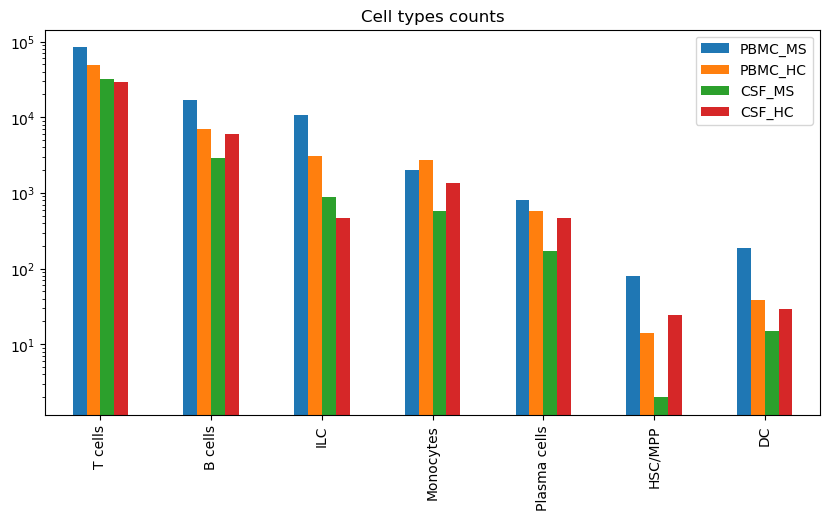

In [11]:
cell_labels_counts_df.plot(kind='bar', figsize=(10, 5), title='Cell types counts', logy=True);

## Rank genes groups

In [12]:
def compute_rank_genes_group_single_cell_type(adata_cell_type, methods=['t-test', 'wilcoxon']):
    # compare each group to the union of the rest of the groups, so MS vs HC
    sc.tl.rank_genes_groups(adata_cell_type, 'MS/HC', random_state=RANDOM_STATE)

    for metohd in methods:
        print(f'Computing rank_genes_groups for {metohd}')
        sc.tl.rank_genes_groups(adata_cell_type, 'MS/HC', method=metohd, key_added=metohd, random_state=RANDOM_STATE)

    return adata_cell_type

def compute_rank_genes_group(adata_cell_type, methods=['t-test', 'wilcoxon']):
    # PBMC
    print('Computing rank_genes_groups for PBMC cells')
    adata_cell_type_PBMC = adata_cell_type[adata_cell_type.obs['cell_type'] == 'PBMC']
    adata_cell_type_PBMC = compute_rank_genes_group_single_cell_type(adata_cell_type_PBMC, methods)

    # CSF
    print('Computing rank_genes_groups for CSF cells')
    adata_cell_type_CSF = adata_cell_type[adata_cell_type.obs['cell_type'] == 'CSF']
    adata_cell_type_CSF = compute_rank_genes_group_single_cell_type(adata_cell_type_CSF, methods)

    return adata_cell_type_PBMC, adata_cell_type_CSF

### T cells

In [13]:
if os.path.exists('write/T_cells_PBMC.h5ad'):
    adata_T_cells_PBMC = sc.read('write/T_cells_PBMC.h5ad')
    adata_T_cells_CSF = sc.read('write/T_cells_CSF.h5ad')
else:
    adata_T_cells = adata[adata.obs['cell_types_labels']=='T cells']
    adata_T_cells_PBMC, adata_T_cells_CSF = compute_rank_genes_group(adata_T_cells)
    adata_T_cells_PBMC.write('write/T_cells_PBMC.h5ad')
    adata_T_cells_CSF.write('write/T_cells_CSF.h5ad')

In [14]:
adata_T_cells_PBMC

AnnData object with n_obs × n_vars = 132953 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [15]:
adata_T_cells_CSF

AnnData object with n_obs × n_vars = 60736 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### T cells PBMC

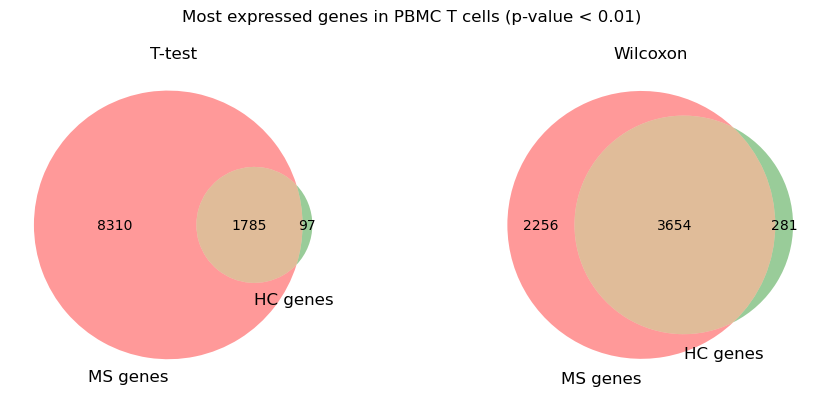

In [16]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_T_cells_PBMC, cell_type_name='T cells', pbmc_csf='PBMC')

All write reported below are for the Wilcoxon test.

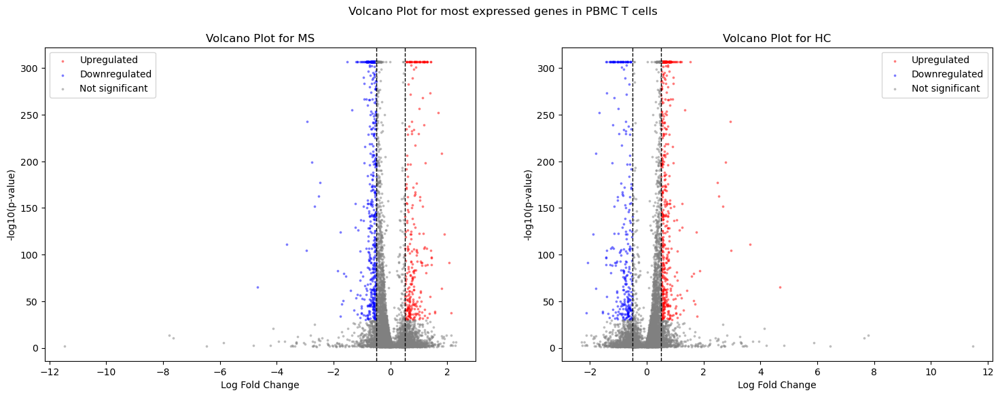

In [17]:
volcano_plot(adata_T_cells_PBMC, cell_type_name='T cells', pbmc_csf='PBMC')

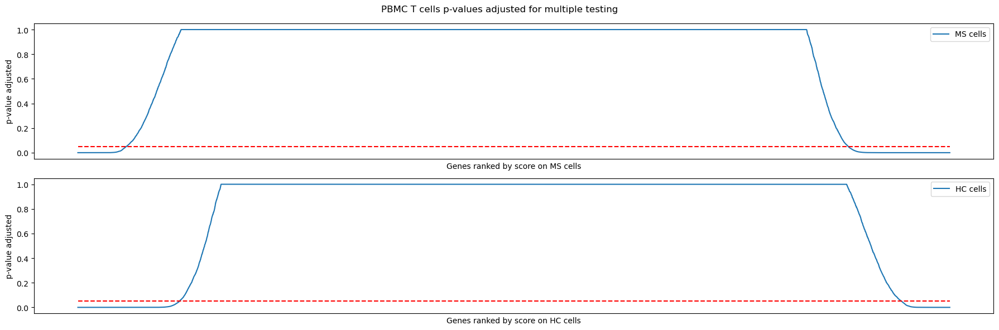

In [18]:
visualize_p_value_adj(adata_T_cells_PBMC, cell_type_name='T cells', pbmc_csf='PBMC')

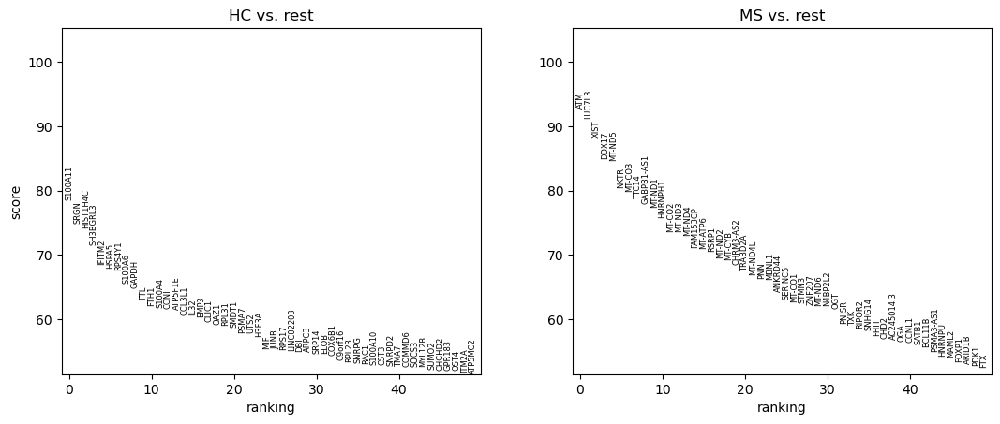

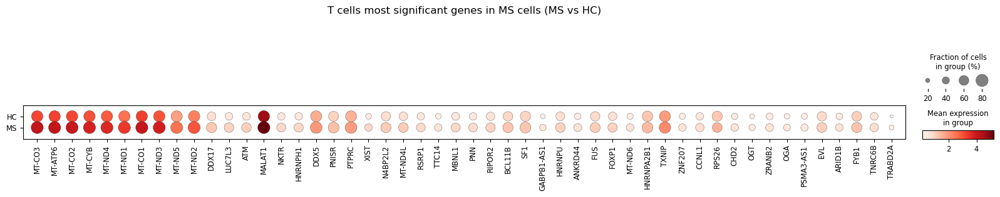

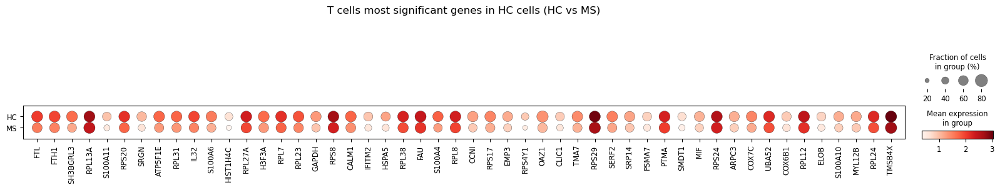

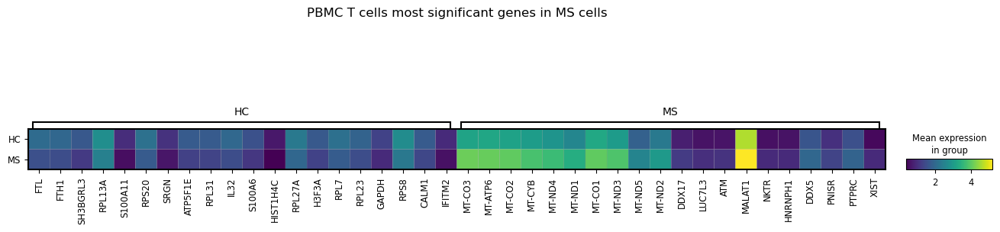

In [19]:
dotplots_and_ranking_most_significant_genes(adata_T_cells_PBMC, cell_type_name='T cells', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



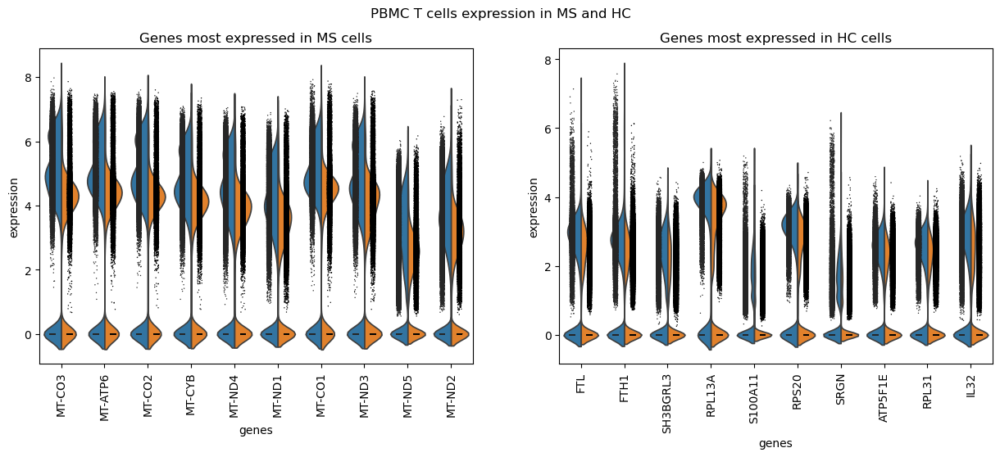

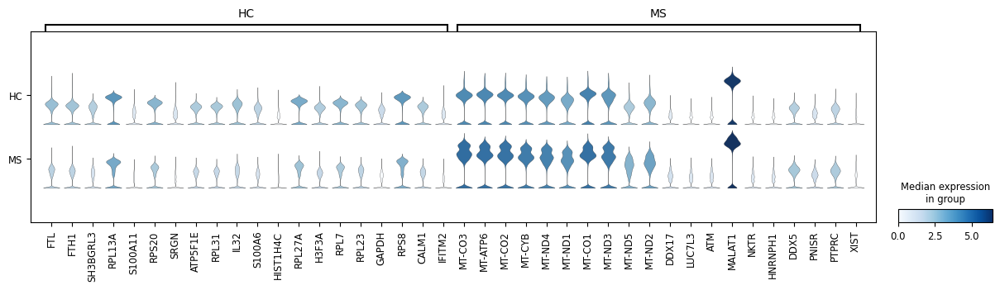

In [20]:
visualize_rank_genes_groups_violin(adata_T_cells_PBMC, cell_type_name='T cells', pbmc_csf='PBMC')

In [21]:
sc.get.rank_genes_groups_df(adata_T_cells_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,5817.000000,5817.000000,5.817000e+03,5.817000e+03
mean,5.764274,0.073960,7.637640e-05,5.233298e-04
std,14.921515,0.608027,2.330723e-04,1.557726e-03
min,-121.030716,-2.304099,0.000000e+00,0.000000e+00
25%,-3.862699,-0.376273,4.685768e-44,1.221971e-42
50%,5.452438,0.197495,3.950241e-14,5.152560e-13
75%,11.702089,0.405235,2.170886e-06,1.887970e-05
max,74.827278,7.787279,1.531040e-03,9.986894e-03


In [22]:
sum(adata_T_cells_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_T_cells_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.15330487033523085

In [23]:
sc.get.rank_genes_groups_df(adata_T_cells_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,5817.000000,5817.000000,5.817000e+03,5.817000e+03
mean,-5.764274,-0.073960,7.637640e-05,5.233298e-04
std,14.921515,0.608027,2.330723e-04,1.557726e-03
min,-74.827278,-7.787279,0.000000e+00,0.000000e+00
25%,-11.702089,-0.405235,4.685768e-44,1.221971e-42
50%,-5.452438,-0.197495,3.950241e-14,5.152560e-13
75%,3.862699,0.376273,2.170886e-06,1.887970e-05
max,121.030716,2.304099,1.531040e-03,9.986894e-03


In [24]:
sum(adata_T_cells_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_T_cells_PBMC.uns['wilcoxon']['pvals_adj']['MS'])

0.15330487033523085

#### T cells CSF

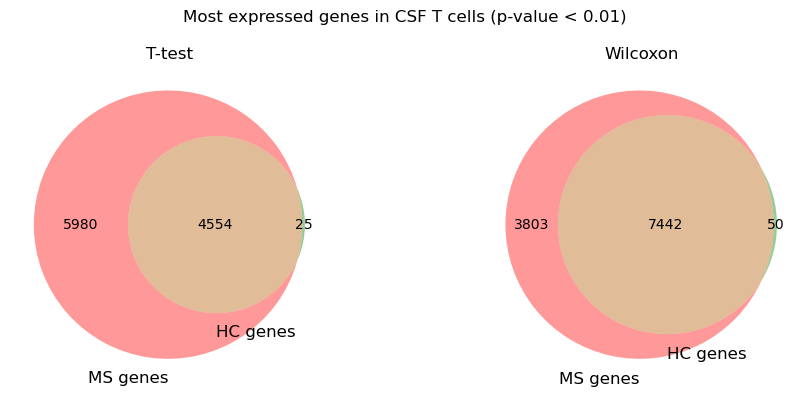

In [25]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_T_cells_CSF, cell_type_name='T cells', pbmc_csf='CSF')

All write reported below are for the Wilcoxon test.

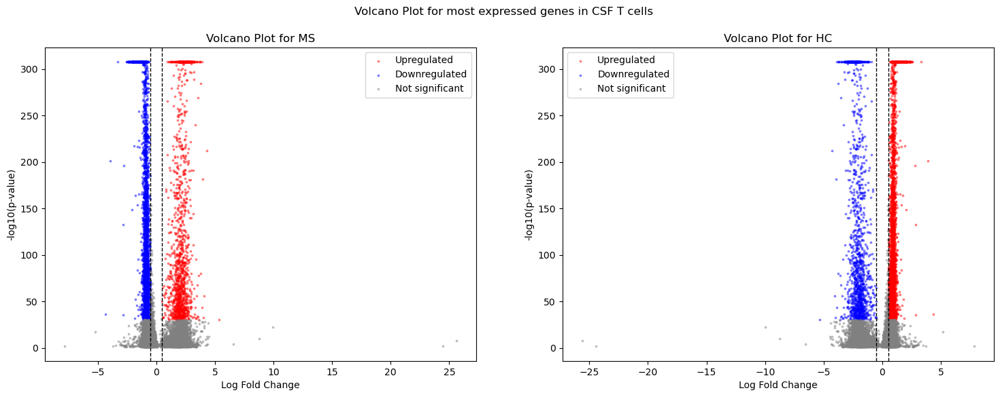

In [26]:
volcano_plot(adata_T_cells_CSF, cell_type_name='T cells', pbmc_csf='CSF')

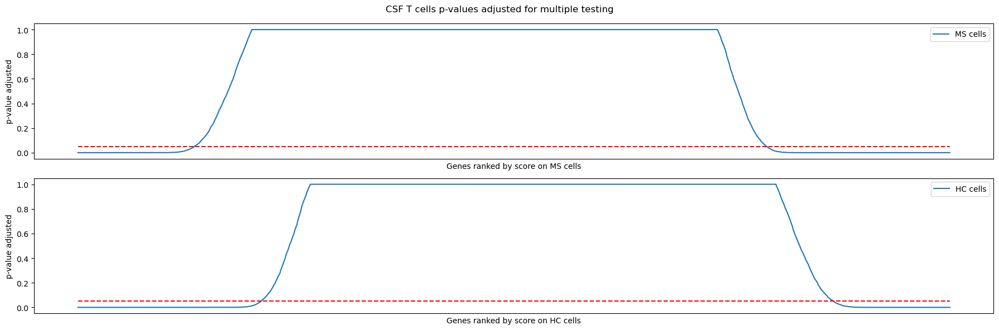

In [27]:
visualize_p_value_adj(adata_T_cells_CSF, cell_type_name='T cells', pbmc_csf='CSF')

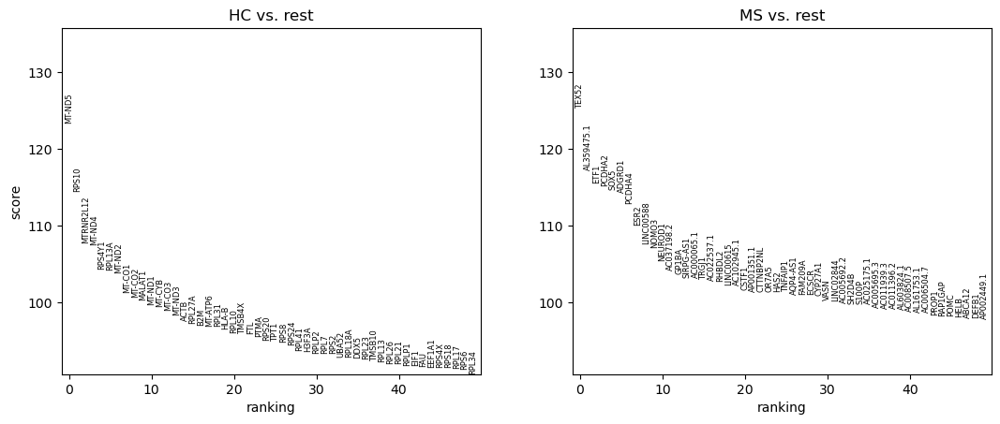

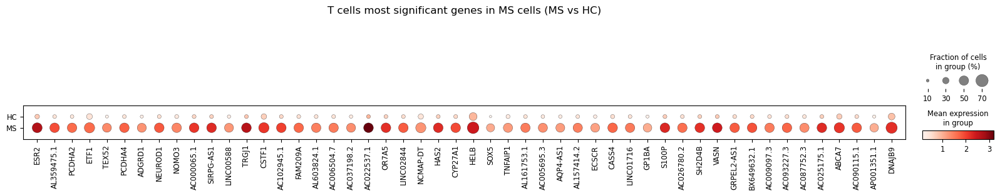

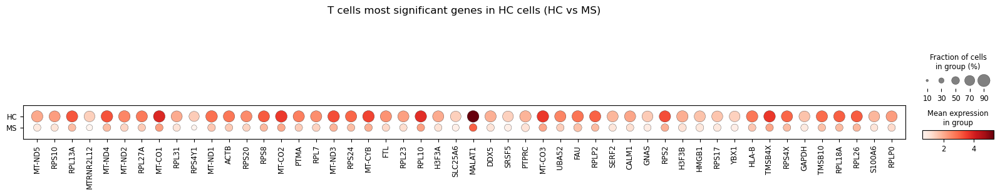

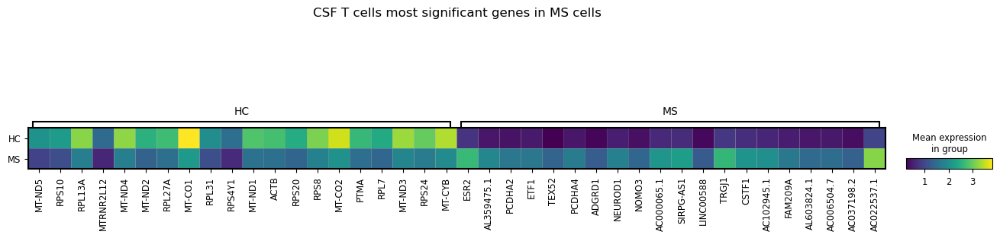

In [28]:
dotplots_and_ranking_most_significant_genes(adata_T_cells_CSF, cell_type_name='T cells', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



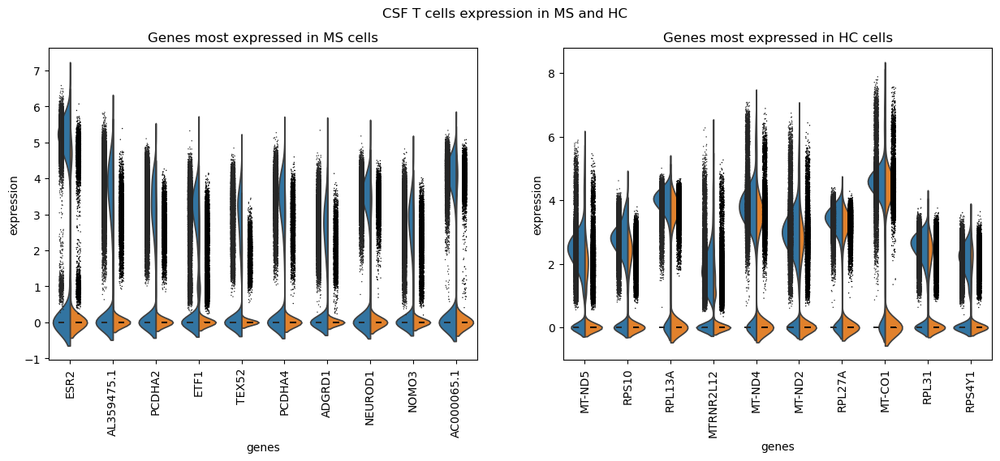

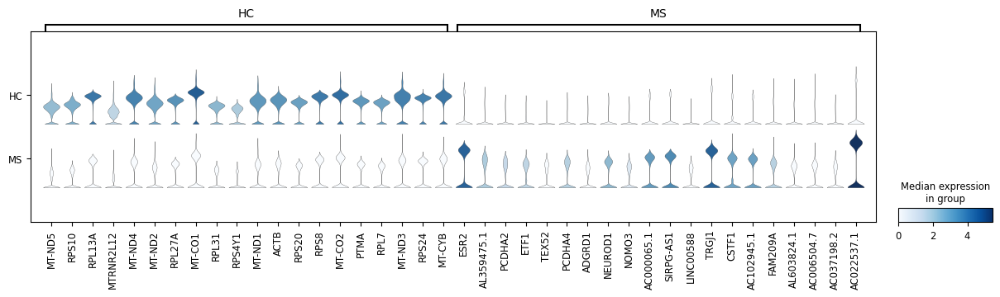

In [29]:
visualize_rank_genes_groups_violin(adata_T_cells_CSF, cell_type_name='T cells', pbmc_csf='CSF')

In [30]:
sc.get.rank_genes_groups_df(adata_T_cells_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,12071.000000,12071.000000,1.207100e+04,1.207100e+04
mean,5.527818,-0.227809,1.195590e-04,3.890005e-04
std,20.584305,1.463412,4.379492e-04,1.401612e-03
min,-87.416199,-25.621943,0.000000e+00,0.000000e+00
25%,-5.325932,-1.820389,2.000895e-76,2.515211e-75
50%,5.281176,0.651990,9.263614e-21,5.823369e-20
75%,13.767882,0.886402,1.149988e-07,4.819699e-07
max,111.419792,7.846269,3.165139e-03,9.949302e-03


In [31]:
sum(adata_T_cells_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_T_cells_CSF.uns['wilcoxon']['pvals_adj']['HC'])

0.31812671305081175

In [32]:
sc.get.rank_genes_groups_df(adata_T_cells_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,12071.000000,12071.000000,1.207100e+04,1.207100e+04
mean,-5.527817,0.227809,1.195590e-04,3.890005e-04
std,20.584305,1.463412,4.379492e-04,1.401612e-03
min,-111.419792,-7.846269,0.000000e+00,0.000000e+00
25%,-13.767882,-0.886402,2.000895e-76,2.515211e-75
50%,-5.281176,-0.651990,9.263614e-21,5.823369e-20
75%,5.325932,1.820389,1.149988e-07,4.819699e-07
max,87.416199,25.621943,3.165139e-03,9.949302e-03


In [33]:
sum(adata_T_cells_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_T_cells_CSF.uns['wilcoxon']['pvals_adj']['MS'])

0.31812671305081175

### B cells

In [34]:
if os.path.exists('write/B_cells_PBMC.h5ad'):
    adata_B_cells_PBMC = sc.read('write/B_cells_PBMC.h5ad')
    adata_B_cells_CSF = sc.read('write/B_cells_CSF.h5ad')
else:
    adata_B_cells = adata[adata.obs['cell_types_labels']=='B cells']
    adata_B_cells_PBMC, adata_B_cells_CSF = compute_rank_genes_group(adata_B_cells)
    adata_B_cells_PBMC.write('write/B_cells_PBMC.h5ad')
    adata_B_cells_CSF.write('write/B_cells_CSF.h5ad')

In [35]:
adata_B_cells_PBMC

AnnData object with n_obs × n_vars = 23886 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [36]:
adata_B_cells_CSF

AnnData object with n_obs × n_vars = 8993 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### B cells PBMC

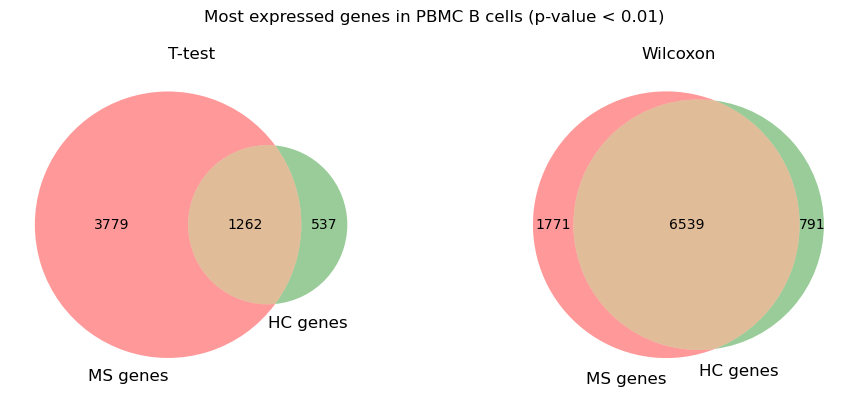

In [37]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_B_cells_PBMC, cell_type_name='B cells', pbmc_csf='PBMC')

All write reported below are for the Wilcoxon test.

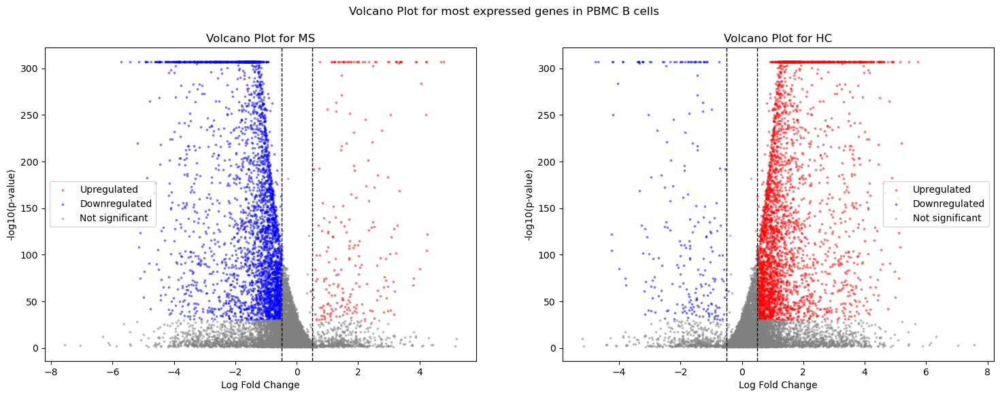

In [38]:
volcano_plot(adata_B_cells_PBMC, cell_type_name='B cells', pbmc_csf='PBMC')

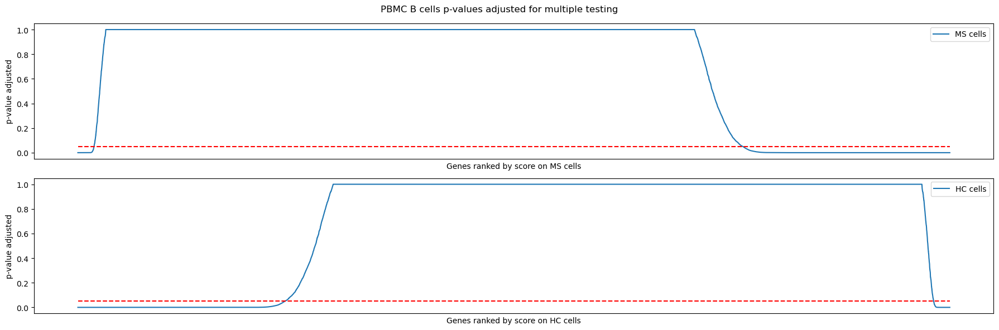

In [39]:
visualize_p_value_adj(adata_B_cells_PBMC, cell_type_name='B cells', pbmc_csf='PBMC')

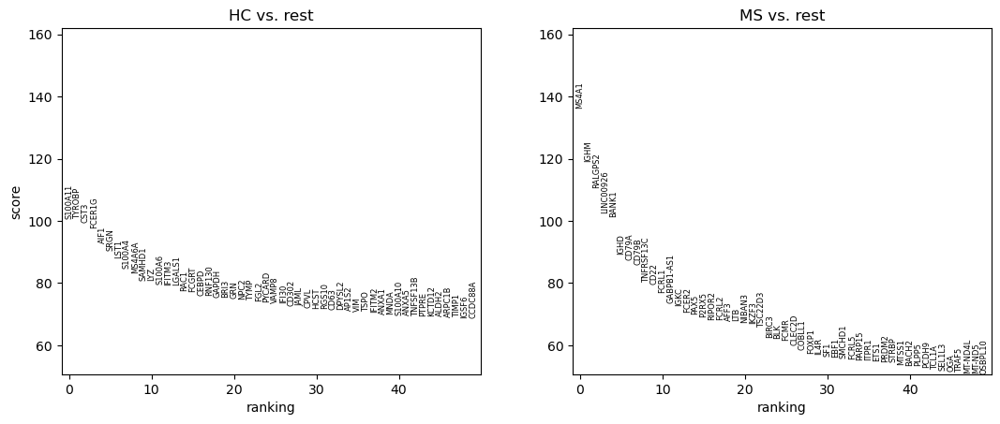

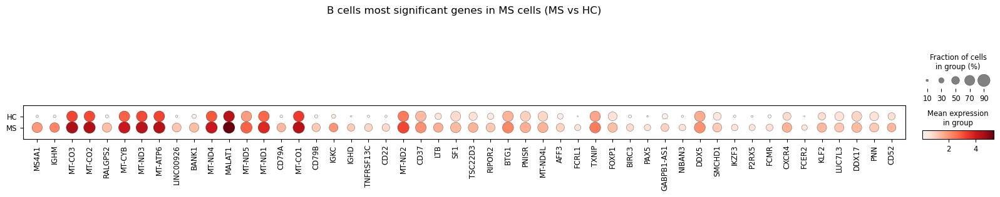

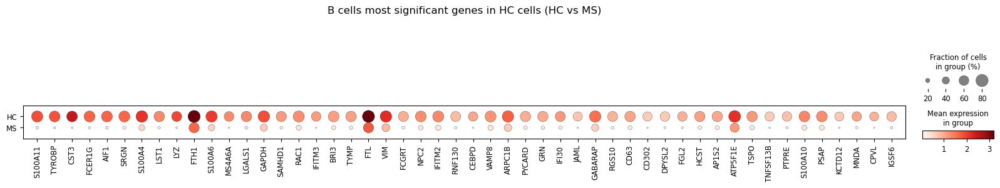

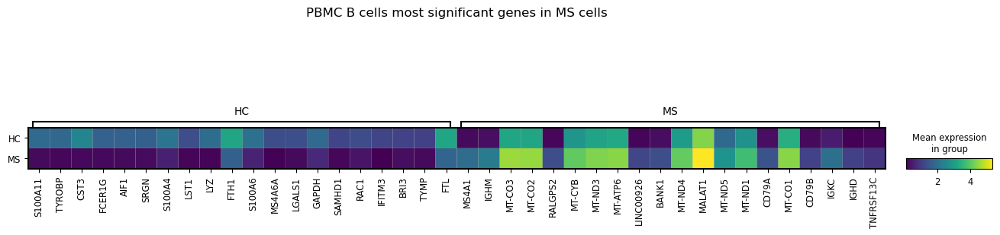

In [40]:
dotplots_and_ranking_most_significant_genes(adata_B_cells_PBMC, cell_type_name='B cells', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



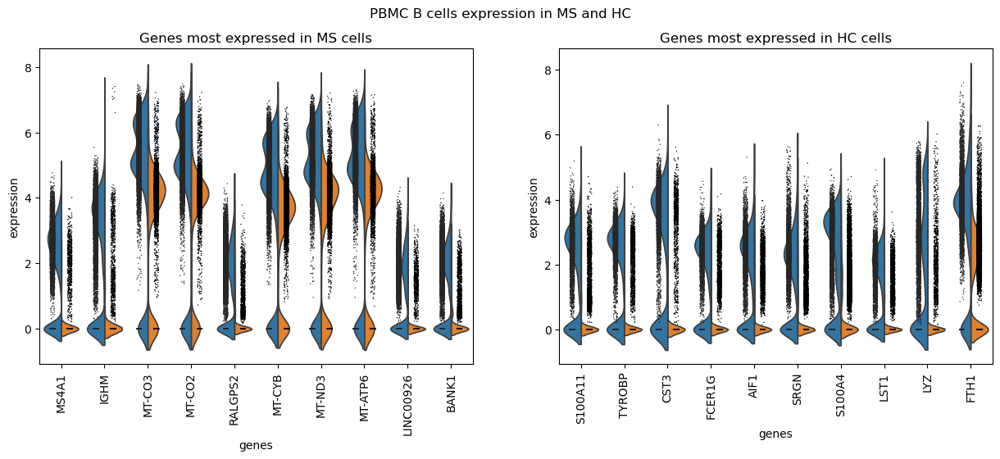

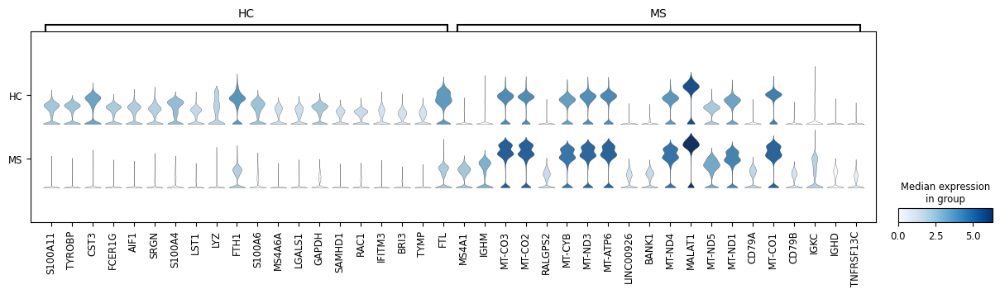

In [41]:
visualize_rank_genes_groups_violin(adata_B_cells_PBMC, cell_type_name='B cells', pbmc_csf='PBMC')

In [42]:
sc.get.rank_genes_groups_df(adata_B_cells_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,9129.000000,9129.000000,9.129000e+03,9.129000e+03
mean,12.883212,0.755349,6.621171e-05,2.826837e-04
std,13.841047,1.220610,2.793588e-04,1.176751e-03
min,-79.965790,-5.207855,0.000000e+00,0.000000e+00
25%,5.179437,0.121404,6.717542e-86,1.116471e-84
50%,10.129515,0.621978,3.334087e-27,2.771273e-26
75%,18.948902,1.245026,3.477480e-09,1.927114e-08
max,78.242760,7.566562,2.399229e-03,9.972215e-03


In [43]:
sum(adata_B_cells_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_B_cells_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.24059139784946237

In [44]:
sc.get.rank_genes_groups_df(adata_B_cells_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,9129.000000,9129.000000,9.129000e+03,9.129000e+03
mean,-12.883211,-0.755349,6.621171e-05,2.826837e-04
std,13.841047,1.220610,2.793588e-04,1.176751e-03
min,-78.242760,-7.566562,0.000000e+00,0.000000e+00
25%,-18.948902,-1.245026,6.717542e-86,1.116471e-84
50%,-10.129515,-0.621978,3.334087e-27,2.771273e-26
75%,-5.179437,-0.121404,3.477480e-09,1.927114e-08
max,79.965790,5.207855,2.399229e-03,9.972215e-03


In [45]:
sum(adata_B_cells_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_B_cells_PBMC.uns['wilcoxon']['pvals_adj']['MS'])

0.24059139784946237

#### B cells CSF

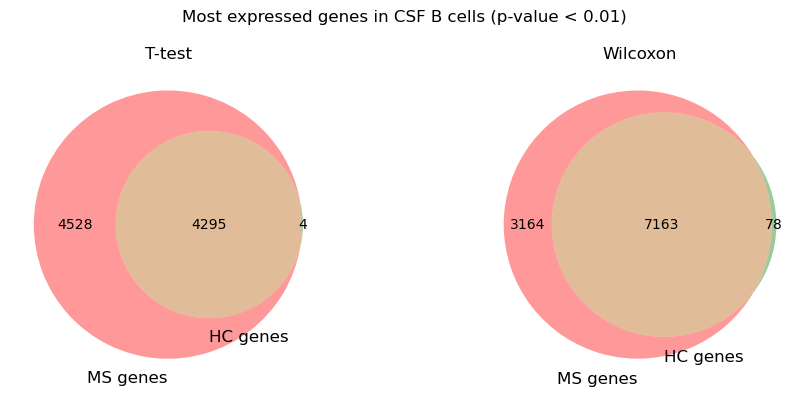

In [46]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_B_cells_CSF, cell_type_name='B cells', pbmc_csf='CSF')

All write reported below are for the Wilcoxon test.

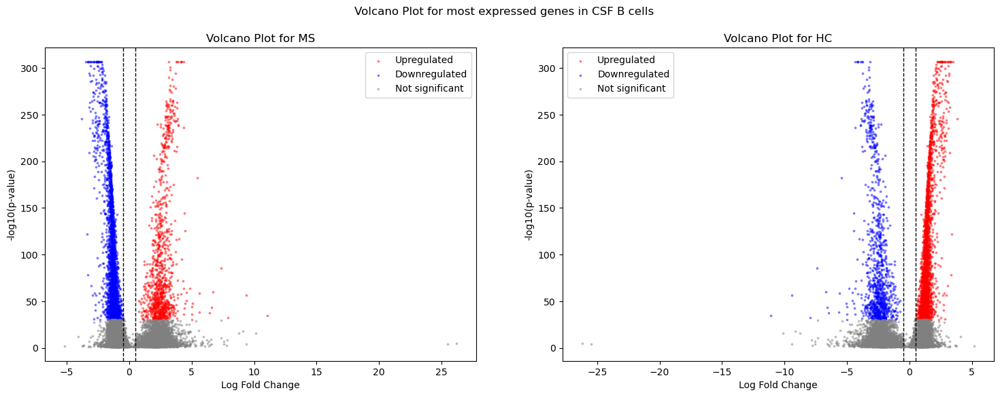

In [47]:
volcano_plot(adata_B_cells_CSF, cell_type_name='B cells', pbmc_csf='CSF')

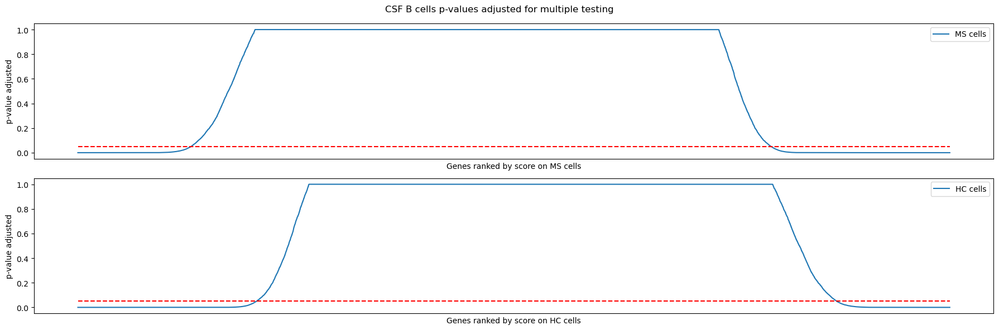

In [48]:
visualize_p_value_adj(adata_B_cells_CSF, cell_type_name='B cells', pbmc_csf='CSF')

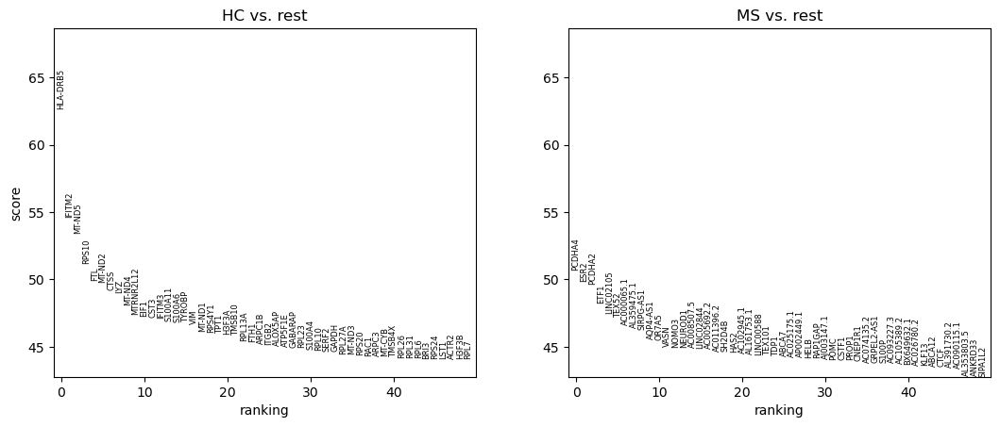

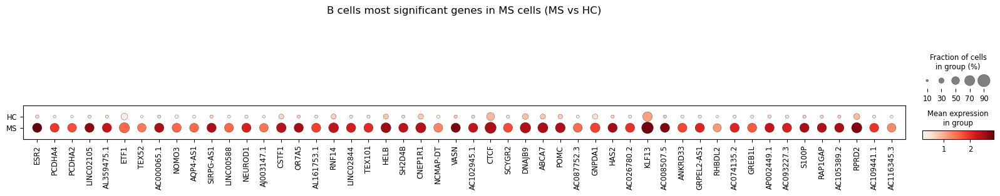

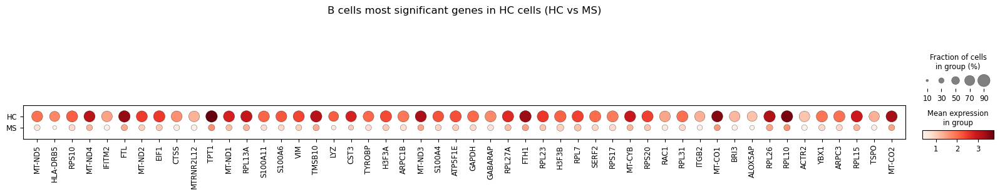

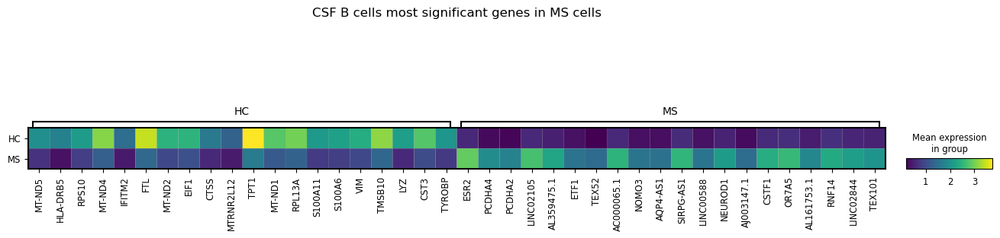

In [49]:
dotplots_and_ranking_most_significant_genes(adata_B_cells_CSF, cell_type_name='B cells', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



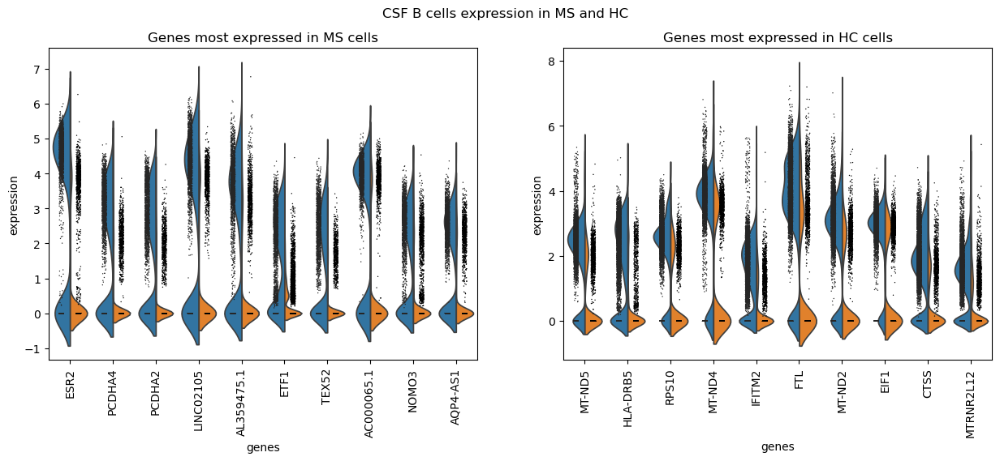

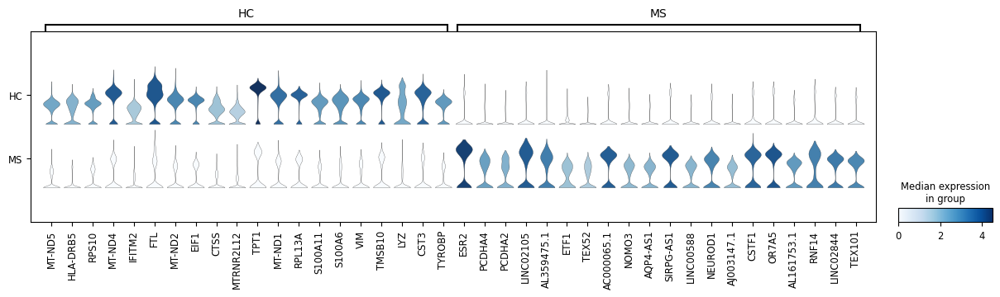

In [50]:
visualize_rank_genes_groups_violin(adata_B_cells_CSF, cell_type_name='B cells', pbmc_csf='CSF')

In [51]:
sc.get.rank_genes_groups_df(adata_B_cells_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,11540.000000,11540.000000,1.154000e+04,1.154000e+04
mean,4.172423,-0.138879,1.322917e-04,4.530999e-04
std,12.953317,1.888688,4.431593e-04,1.488450e-03
min,-41.581554,-26.204515,0.000000e+00,0.000000e+00
25%,-4.813109,-2.090614,7.411824e-48,9.745621e-47
50%,5.015682,0.951227,2.180723e-16,1.433937e-15
75%,11.782488,1.268318,8.380791e-07,3.674077e-06
max,44.307304,4.101263,3.015781e-03,9.916015e-03


In [52]:
sum(adata_B_cells_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_B_cells_CSF.uns['wilcoxon']['pvals_adj']['HC'])

0.3041324056504322

In [53]:
sc.get.rank_genes_groups_df(adata_B_cells_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,11540.000000,11540.000000,1.154000e+04,1.154000e+04
mean,-4.172423,0.138879,1.322917e-04,4.530999e-04
std,12.953317,1.888688,4.431593e-04,1.488450e-03
min,-44.307304,-4.101263,0.000000e+00,0.000000e+00
25%,-11.782488,-1.268318,7.411824e-48,9.745621e-47
50%,-5.015682,-0.951227,2.180723e-16,1.433937e-15
75%,4.813109,2.090614,8.380791e-07,3.674077e-06
max,41.581554,26.204515,3.015781e-03,9.916015e-03


In [54]:
sum(adata_B_cells_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_B_cells_CSF.uns['wilcoxon']['pvals_adj']['MS'])

0.3041324056504322

### ILC

In [55]:
if os.path.exists('write/ILC_PBMC.h5ad'):
    adata_ILC_PBMC = sc.read('write/ILC_PBMC.h5ad')
    adata_ILC_CSF = sc.read('write/ILC_CSF.h5ad')
else:
    adata_ILC = adata[adata.obs['cell_types_labels']=='ILC']
    adata_ILC_PBMC, adata_ILC_CSF = compute_rank_genes_group(adata_ILC)
    adata_ILC_PBMC.write('write/ILC_PBMC.h5ad')
    adata_ILC_CSF.write('write/ILC_CSF.h5ad')

In [56]:
adata_ILC_PBMC

AnnData object with n_obs × n_vars = 13776 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [57]:
adata_ILC_CSF

AnnData object with n_obs × n_vars = 1360 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### ILC PBMC

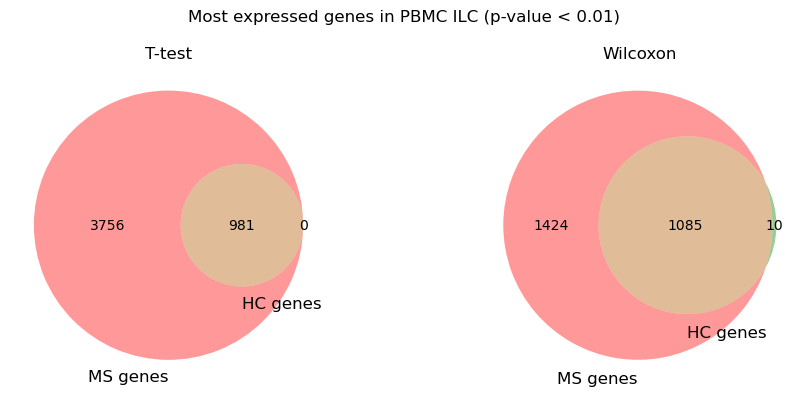

In [58]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_ILC_PBMC, cell_type_name='ILC', pbmc_csf='PBMC')

All write reported below are for the Wilcoxon test.

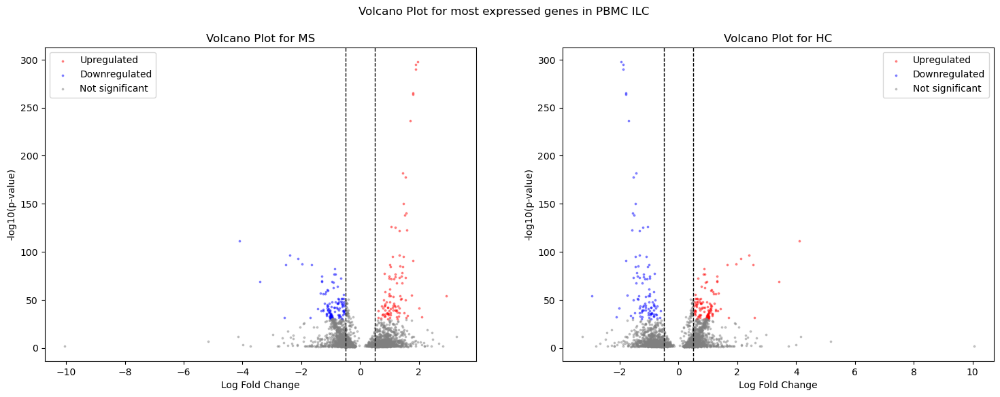

In [59]:
volcano_plot(adata_ILC_PBMC, cell_type_name='ILC', pbmc_csf='PBMC')

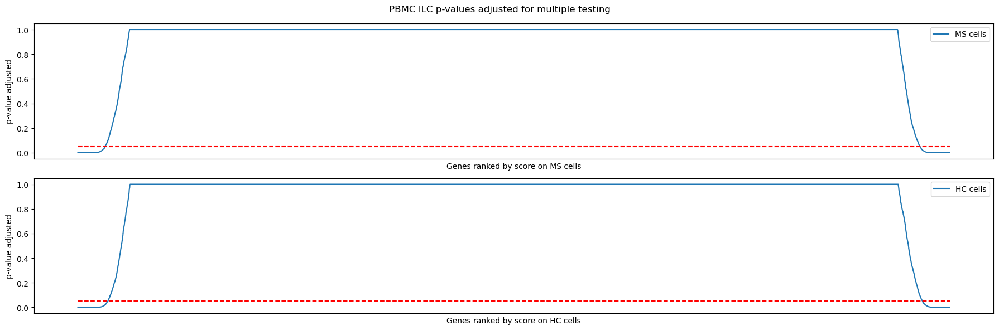

In [60]:
visualize_p_value_adj(adata_ILC_PBMC, cell_type_name='ILC', pbmc_csf='PBMC')

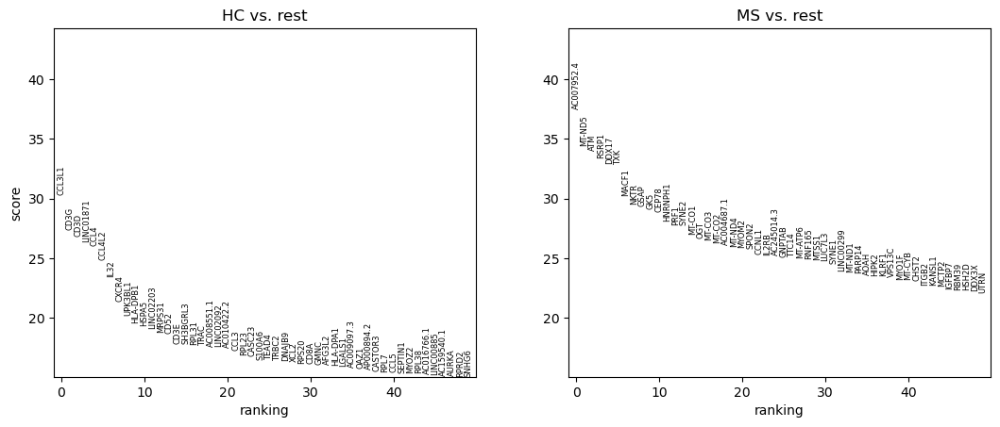

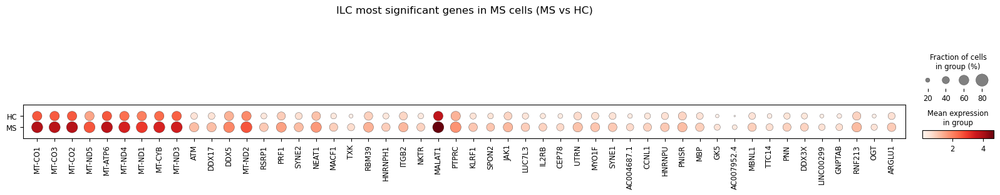

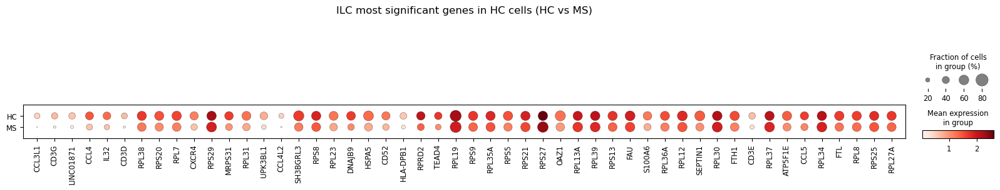

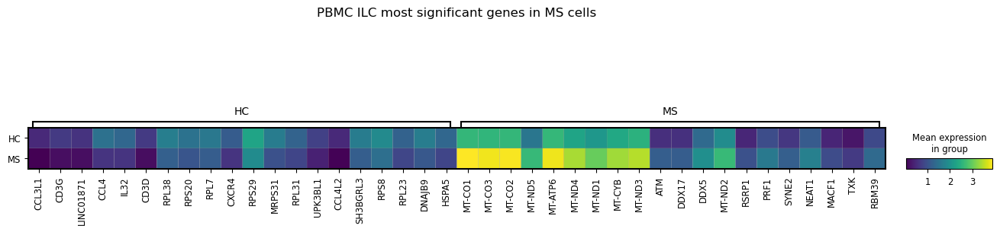

In [61]:
dotplots_and_ranking_most_significant_genes(adata_ILC_PBMC, cell_type_name='ILC', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



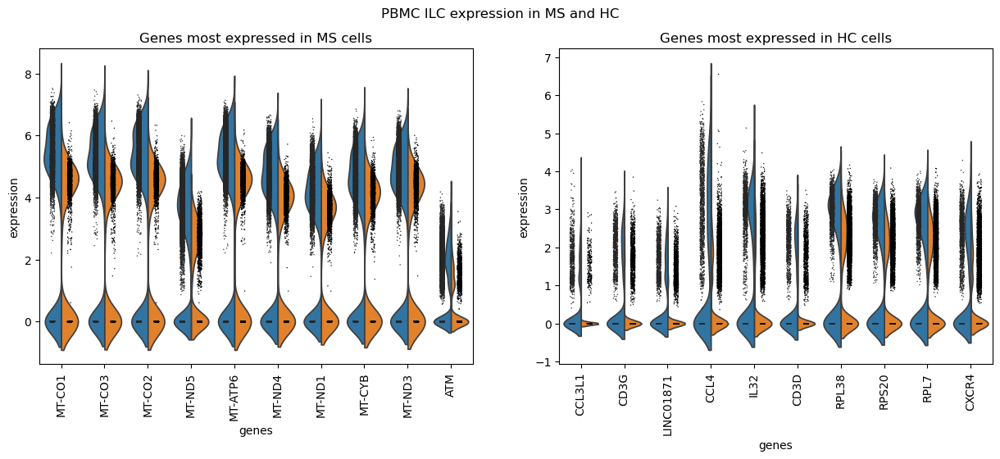

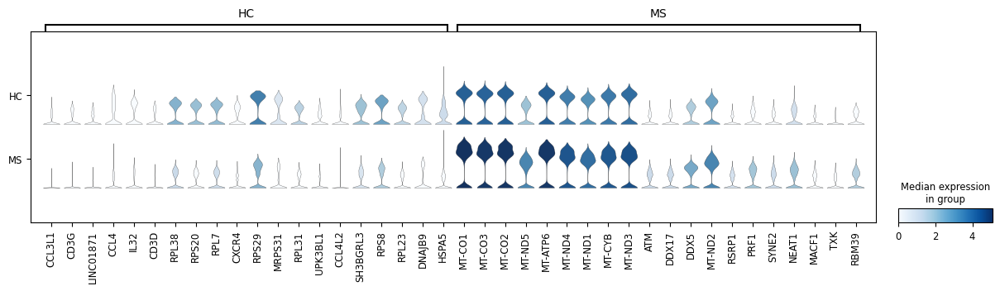

In [62]:
visualize_rank_genes_groups_violin(adata_ILC_PBMC, cell_type_name='ILC', pbmc_csf='PBMC')

In [63]:
sc.get.rank_genes_groups_df(adata_ILC_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,2076.000000,2076.000000,2.076000e+03,2.076000e+03
mean,0.640258,-0.066347,3.896584e-05,7.641689e-04
std,8.193727,0.884832,9.923829e-05,1.872807e-03
min,-37.226532,-3.281055,2.540448e-303,9.639476e-299
25%,-5.221071,-0.821064,3.671405e-18,2.680142e-16
50%,3.639366,0.281304,9.269117e-09,3.386658e-07
75%,6.426758,0.608977,1.092927e-05,2.663026e-04
max,22.811686,5.175715,5.418154e-04,9.903008e-03


In [64]:
sum(adata_ILC_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_ILC_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.05471220746363061

In [65]:
sc.get.rank_genes_groups_df(adata_ILC_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,2076.000000,2076.000000,2.076000e+03,2.076000e+03
mean,-0.640258,0.066347,3.896584e-05,7.641689e-04
std,8.193727,0.884832,9.923829e-05,1.872807e-03
min,-22.811686,-5.175715,2.540448e-303,9.639476e-299
25%,-6.426758,-0.608977,3.671405e-18,2.680142e-16
50%,-3.639366,-0.281304,9.269117e-09,3.386658e-07
75%,5.221071,0.821064,1.092927e-05,2.663026e-04
max,37.226532,3.281055,5.418154e-04,9.903008e-03


In [66]:
sum(adata_ILC_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_ILC_PBMC.uns['wilcoxon']['pvals_adj']['MS'])

0.05471220746363061

#### ILC CSF

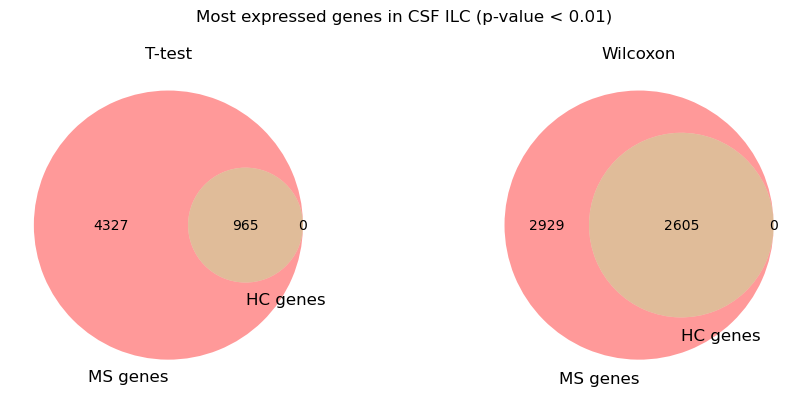

In [67]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_ILC_CSF, cell_type_name='ILC', pbmc_csf='CSF')

All write reported below are for the Wilcoxon test.

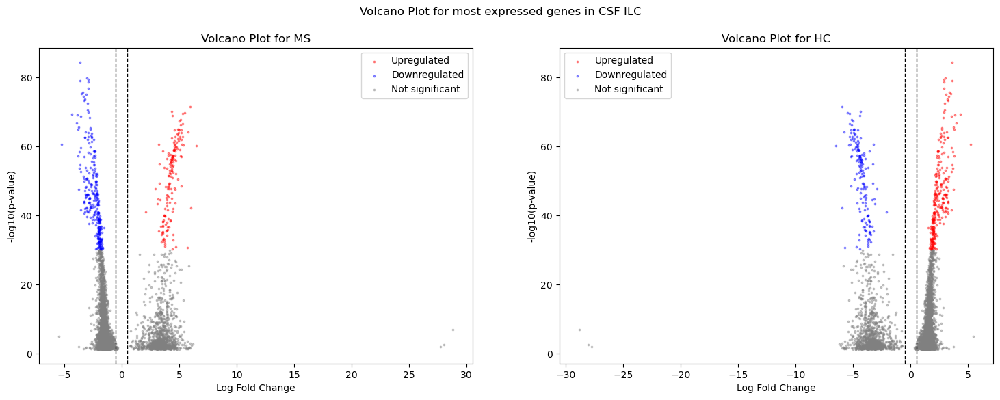

In [68]:
volcano_plot(adata_ILC_CSF, cell_type_name='ILC', pbmc_csf='CSF')

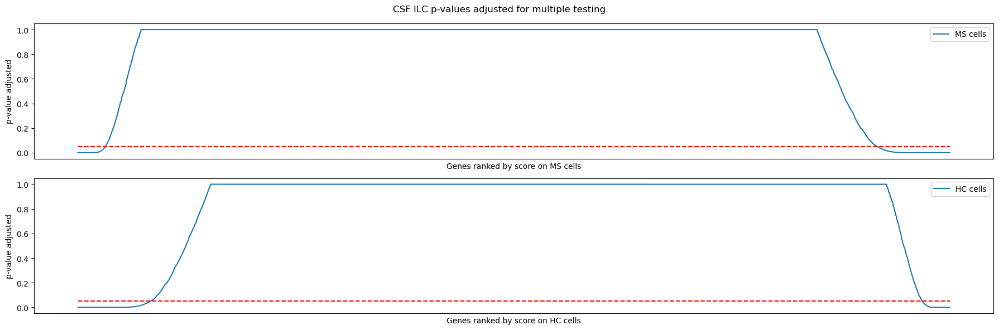

In [69]:
visualize_p_value_adj(adata_ILC_CSF, cell_type_name='ILC', pbmc_csf='CSF')

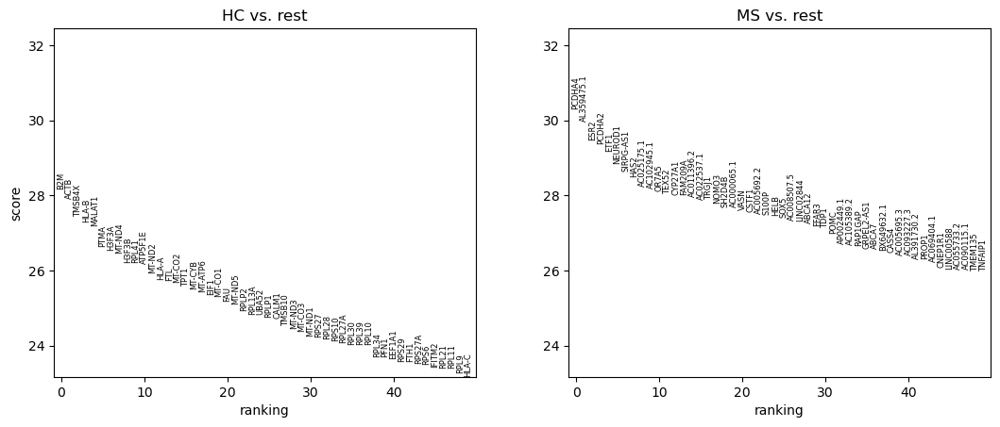

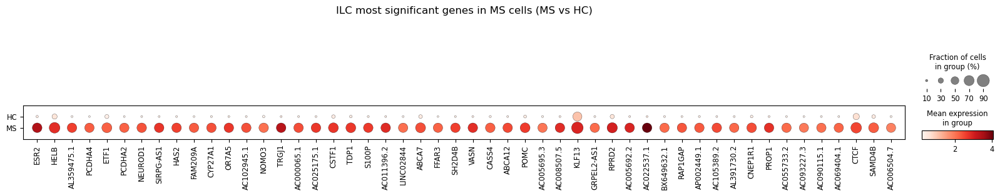

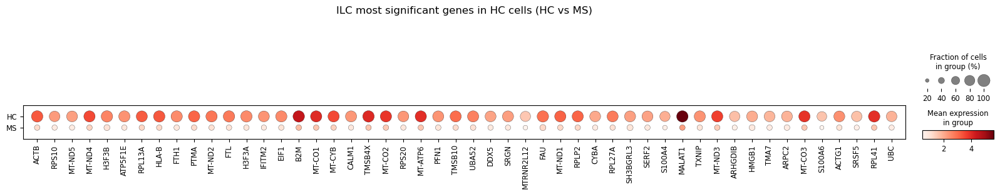

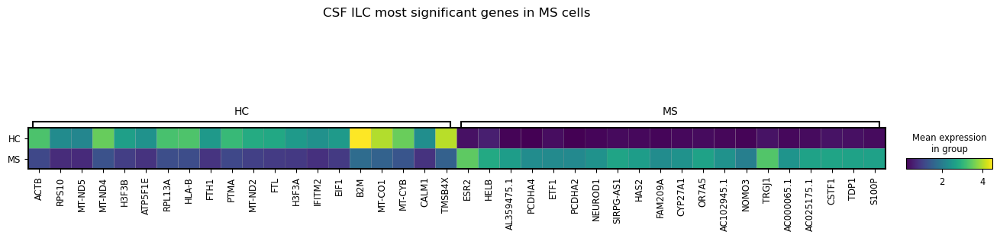

In [70]:
dotplots_and_ranking_most_significant_genes(adata_ILC_CSF, cell_type_name='ILC', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



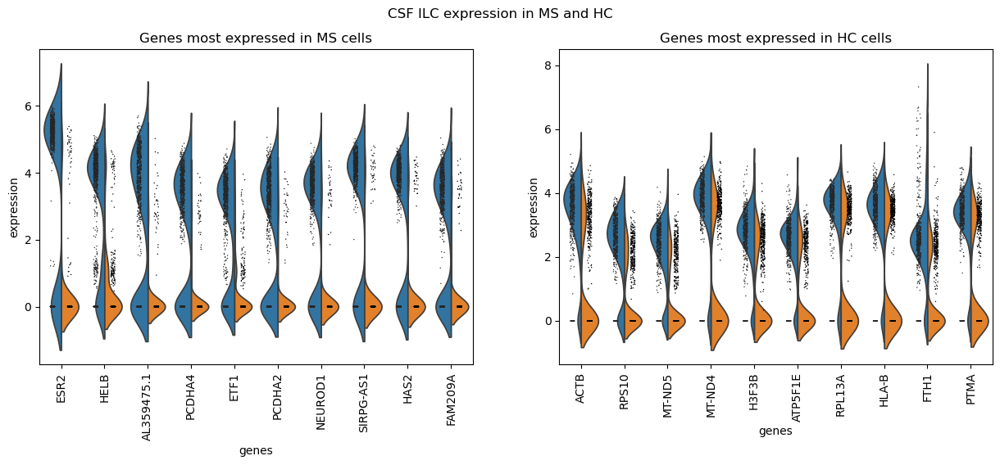

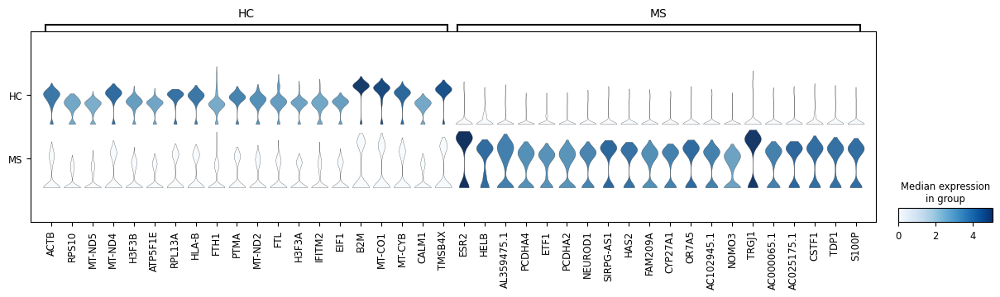

In [71]:
visualize_rank_genes_groups_violin(adata_ILC_CSF, cell_type_name='ILC', pbmc_csf='CSF')

In [72]:
sc.get.rank_genes_groups_df(adata_ILC_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,3570.000000,3570.000000,3.570000e+03,3.570000e+03
mean,3.073504,0.225496,7.377414e-05,8.469883e-04
std,7.289941,2.475798,1.779052e-04,1.960087e-03
min,-18.408632,-28.828417,1.171600e-89,4.445518e-85
25%,-3.531439,-2.195210,4.747281e-18,2.016565e-16
50%,4.554489,1.449247,1.662756e-08,3.533511e-07
75%,7.230698,1.708103,2.489346e-05,3.527429e-04
max,20.077045,5.476398,9.330228e-04,9.916699e-03


In [73]:
sum(adata_ILC_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_ILC_CSF.uns['wilcoxon']['pvals_adj']['HC'])

0.09408602150537634

In [74]:
sc.get.rank_genes_groups_df(adata_ILC_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,3570.000000,3570.000000,3.570000e+03,3.570000e+03
mean,-3.073504,-0.225497,7.377414e-05,8.469883e-04
std,7.289941,2.475798,1.779052e-04,1.960087e-03
min,-20.077045,-5.476398,1.171600e-89,4.445518e-85
25%,-7.230698,-1.708103,4.747281e-18,2.016565e-16
50%,-4.554489,-1.449247,1.662756e-08,3.533511e-07
75%,3.531439,2.195210,2.489346e-05,3.527429e-04
max,18.408632,28.828417,9.330228e-04,9.916699e-03


In [75]:
sum(adata_ILC_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_ILC_CSF.uns['wilcoxon']['pvals_adj']['MS'])

0.09408602150537634

### Monocytes

In [76]:
if os.path.exists('write/Monocytes_PBMC.h5ad'):
    adata_Monocytes_PBMC = sc.read('write/Monocytes_PBMC.h5ad')
    adata_Monocytes_CSF = sc.read('write/Monocytes_CSF.h5ad')
else:
    adata_Monocytes = adata[adata.obs['cell_types_labels']=='Monocytes']
    adata_Monocytes_PBMC, adata_Monocytes_CSF = compute_rank_genes_group(adata_Monocytes)
    adata_Monocytes_PBMC.write('write/Monocytes_PBMC.h5ad')
    adata_Monocytes_CSF.write('write/Monocytes_CSF.h5ad')

In [77]:
adata_Monocytes_PBMC

AnnData object with n_obs × n_vars = 4713 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [78]:
adata_Monocytes_CSF

AnnData object with n_obs × n_vars = 1936 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### Monocytes PBMC

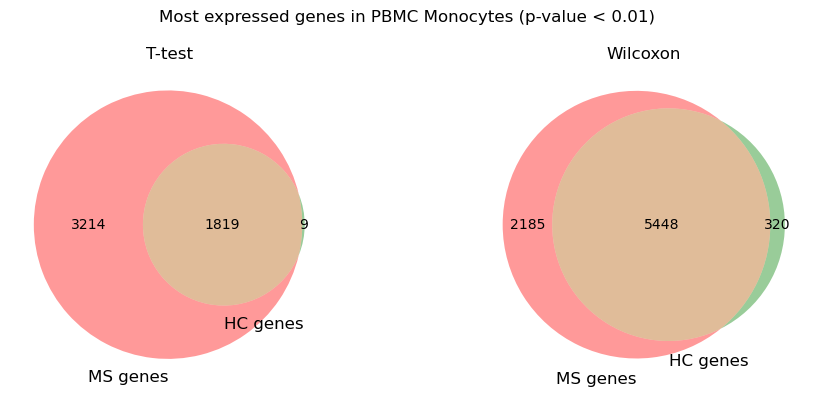

In [79]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_Monocytes_PBMC, cell_type_name='Monocytes', pbmc_csf='PBMC')

All write reported below are for the wilcoxon test.

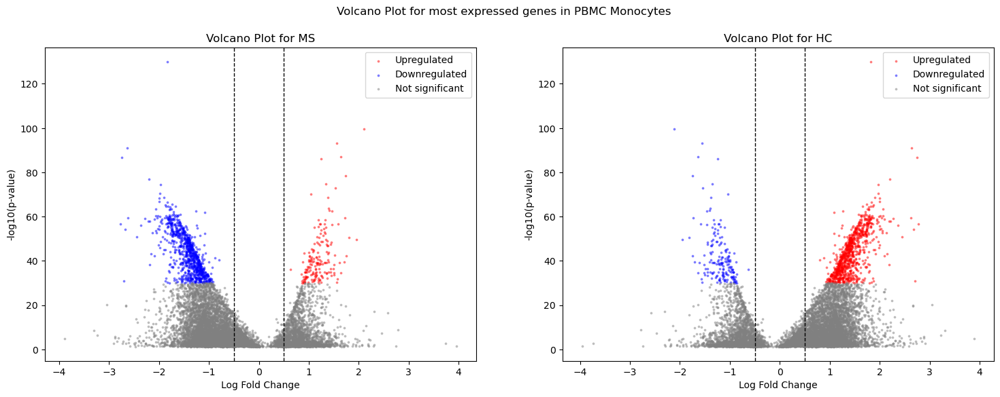

In [80]:
volcano_plot(adata_Monocytes_PBMC, cell_type_name='Monocytes', pbmc_csf='PBMC')

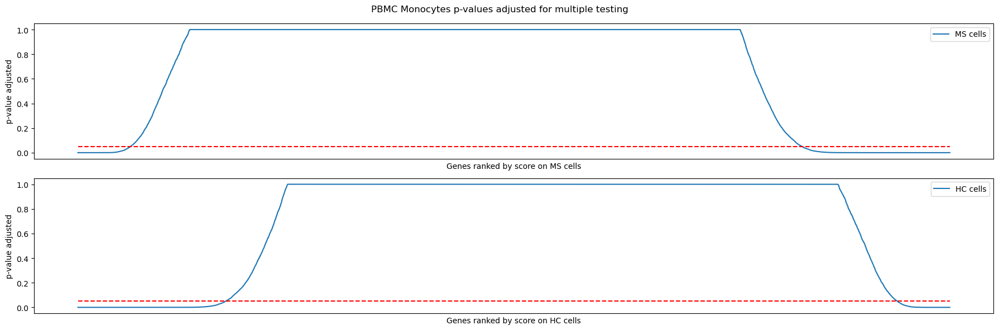

In [81]:
visualize_p_value_adj(adata_Monocytes_PBMC, cell_type_name='Monocytes', pbmc_csf='PBMC')

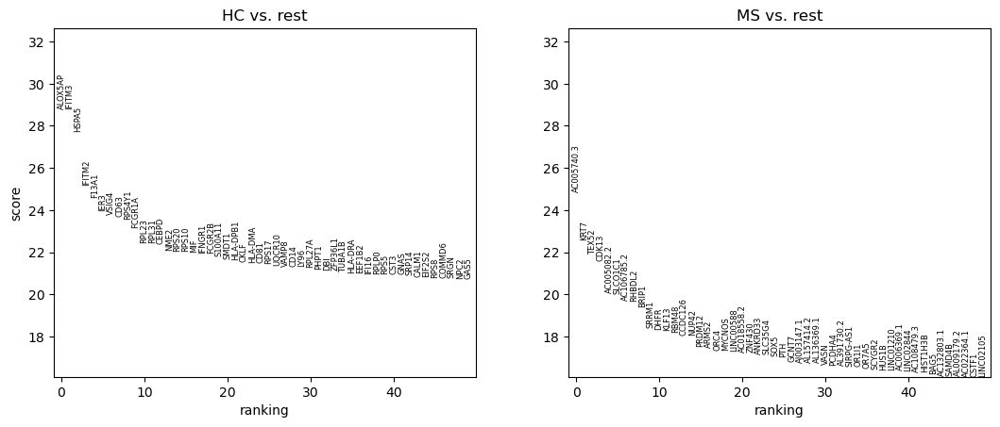

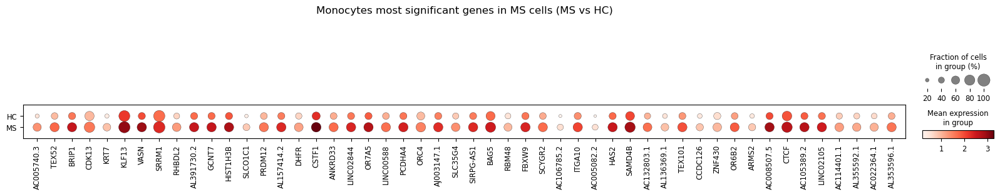

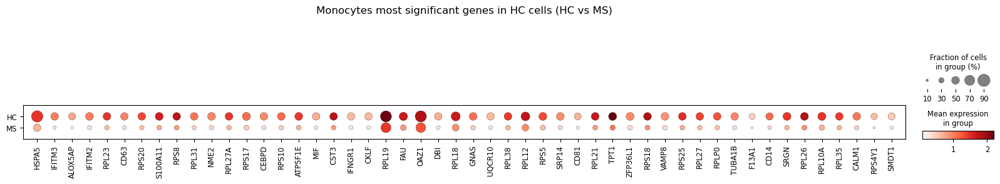

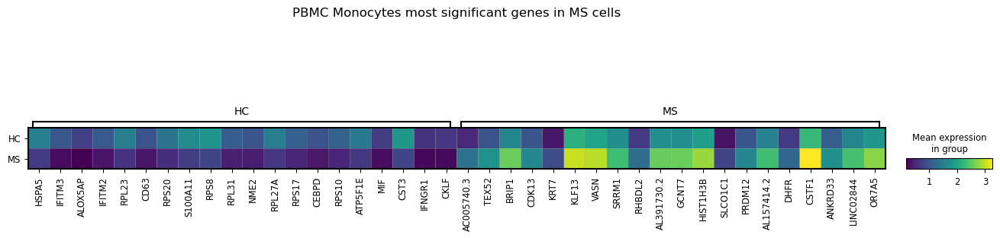

In [82]:
dotplots_and_ranking_most_significant_genes(adata_Monocytes_PBMC, cell_type_name='Monocytes', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



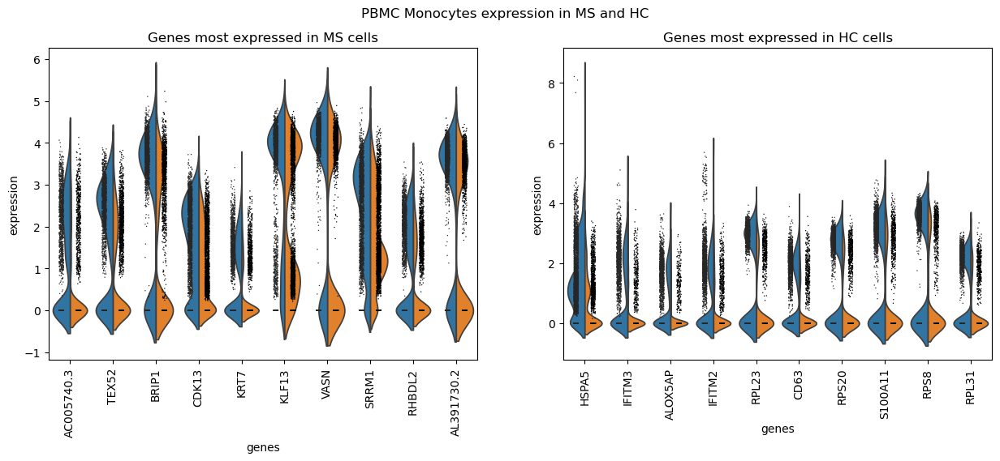

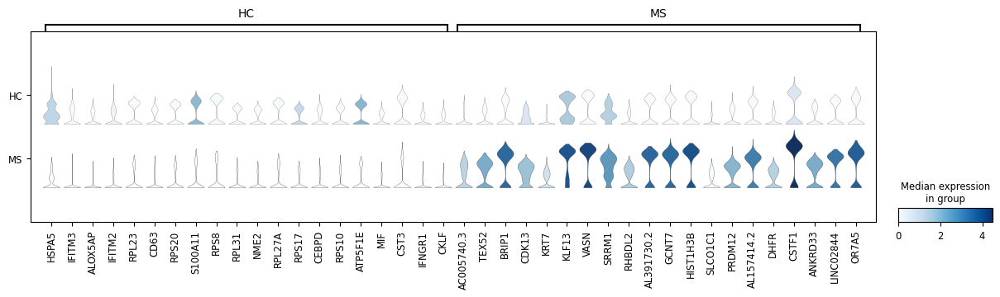

In [83]:
visualize_rank_genes_groups_violin(adata_Monocytes_PBMC, cell_type_name='Monocytes', pbmc_csf='PBMC')

In [84]:
sc.get.rank_genes_groups_df(adata_Monocytes_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,7596.000000,7596.000000,7.596000e+03,7.596000e+03
mean,4.195626,0.565805,1.188081e-04,6.282681e-04
std,6.977103,0.904562,3.363031e-04,1.727631e-03
min,-21.709915,-3.732726,2.369842e-135,8.992130e-131
25%,3.157236,0.154522,3.634982e-21,7.260197e-20
50%,5.238523,0.833989,3.017226e-10,3.013966e-09
75%,8.648250,1.207704,1.357966e-05,9.044127e-05
max,24.760836,3.893007,1.998736e-03,9.984208e-03


In [85]:
sum(adata_Monocytes_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_Monocytes_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.20018975332068312

In [86]:
sc.get.rank_genes_groups_df(adata_Monocytes_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,7596.000000,7596.000000,7.596000e+03,7.596000e+03
mean,-4.195625,-0.565805,1.188081e-04,6.282681e-04
std,6.977103,0.904562,3.363031e-04,1.727631e-03
min,-24.760836,-3.893007,2.369842e-135,8.992130e-131
25%,-8.648250,-1.207704,3.634982e-21,7.260197e-20
50%,-5.238523,-0.833989,3.017226e-10,3.013966e-09
75%,-3.157236,-0.154522,1.357966e-05,9.044127e-05
max,21.709915,3.732726,1.998736e-03,9.984208e-03


In [87]:
sum(adata_Monocytes_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_Monocytes_PBMC.uns[
    'wilcoxon']['pvals_adj']['MS'])

0.20018975332068312

#### Monocytes CSF

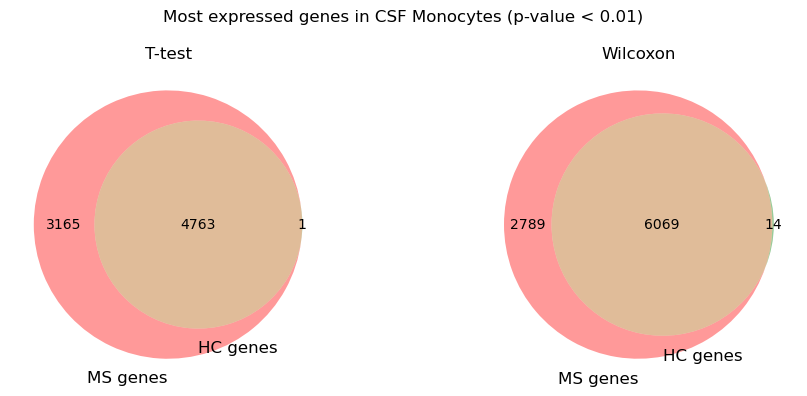

In [88]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_Monocytes_CSF, cell_type_name='Monocytes', pbmc_csf='CSF')

All write reported below are for the wilcoxon test.

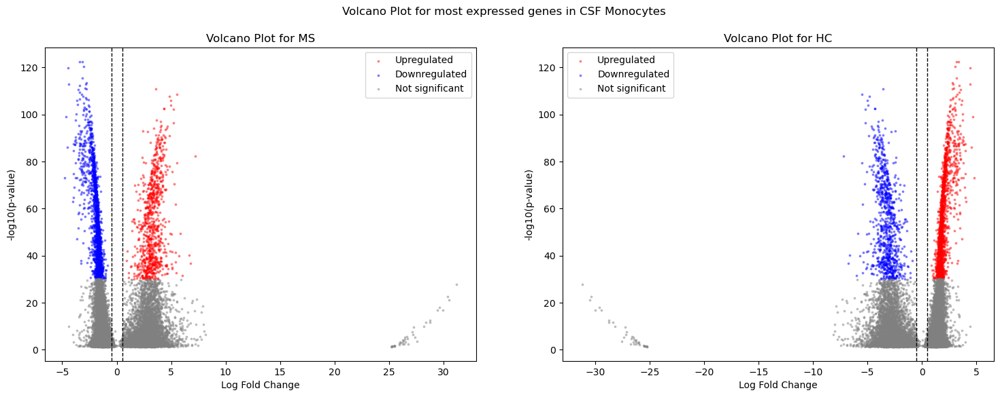

In [89]:
volcano_plot(adata_Monocytes_CSF, cell_type_name='Monocytes', pbmc_csf='CSF')

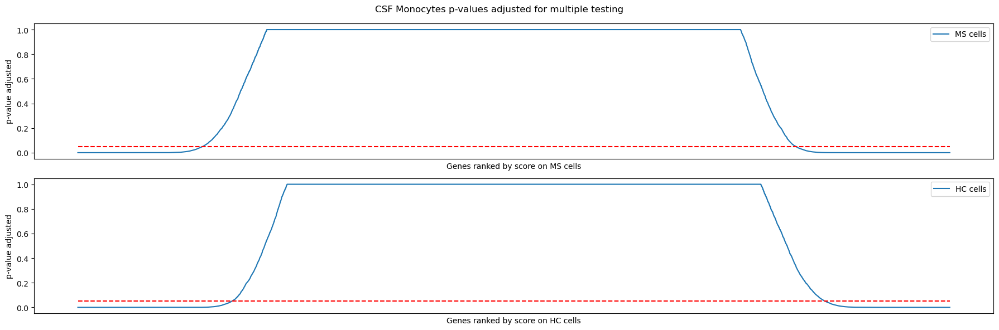

In [90]:
visualize_p_value_adj(adata_Monocytes_CSF, cell_type_name='Monocytes', pbmc_csf='CSF')

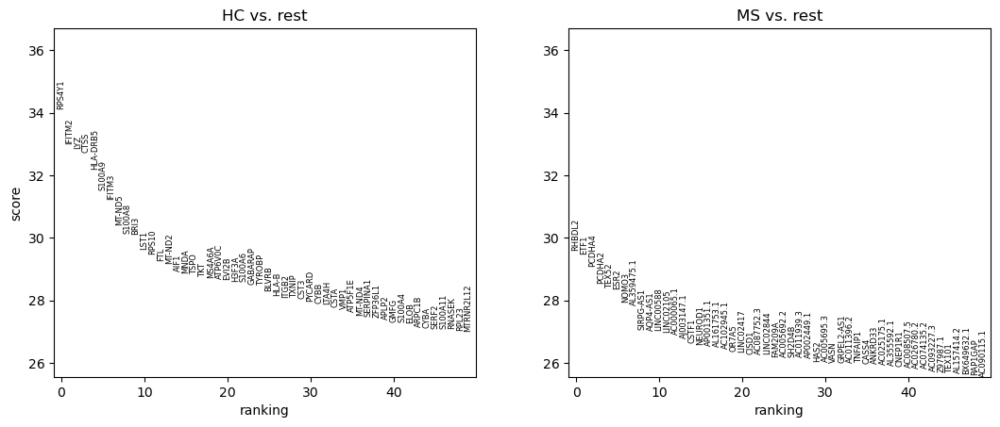

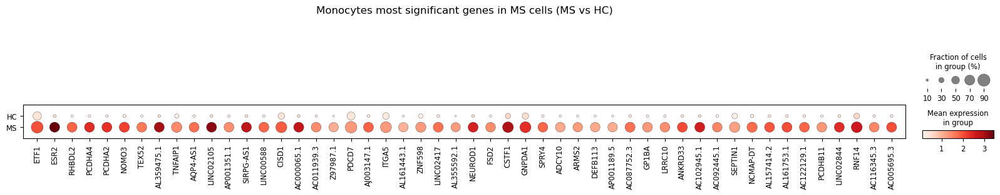

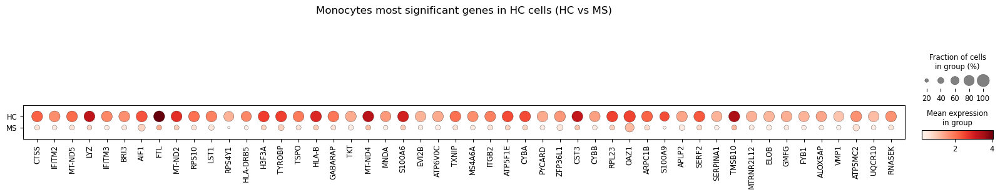

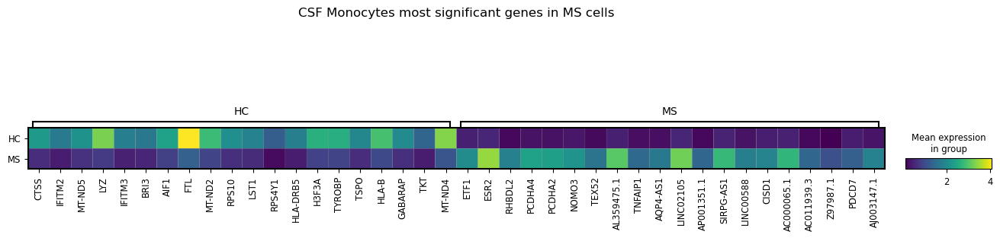

In [91]:
dotplots_and_ranking_most_significant_genes(adata_Monocytes_CSF, cell_type_name='Monocytes', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



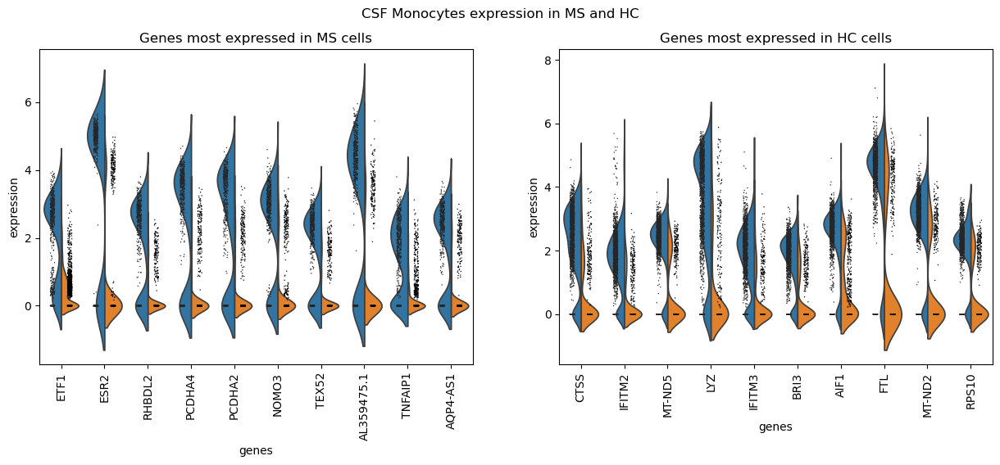

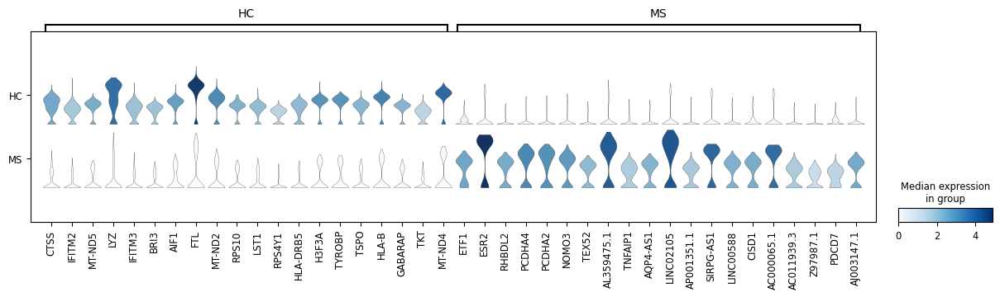

In [92]:
visualize_rank_genes_groups_violin(adata_Monocytes_CSF, cell_type_name='Monocytes', pbmc_csf='CSF')

In [93]:
sc.get.rank_genes_groups_df(adata_Monocytes_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,10847.000000,10847.000000,1.084700e+04,1.084700e+04
mean,1.643404,-0.477917,1.382586e-04,5.061497e-04
std,9.530907,2.772005,4.410115e-04,1.578009e-03
min,-22.792902,-31.194181,8.825867e-128,3.348887e-123
25%,-5.635391,-2.807551,2.936050e-29,4.107100e-28
50%,3.785091,1.065678,2.379275e-12,1.664439e-11
75%,8.457415,1.609213,3.825086e-06,1.784021e-05
max,24.047688,4.794166,2.855712e-03,9.989594e-03


In [94]:
sum(adata_Monocytes_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_Monocytes_CSF.uns[
    'wilcoxon']['pvals_adj']['HC'])

0.2858686485346827

In [95]:
sc.get.rank_genes_groups_df(adata_Monocytes_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,10847.000000,10847.000000,1.084700e+04,1.084700e+04
mean,-1.643404,0.477917,1.382586e-04,5.061497e-04
std,9.530907,2.772005,4.410115e-04,1.578009e-03
min,-24.047688,-4.794166,8.825867e-128,3.348887e-123
25%,-8.457415,-1.609213,2.936050e-29,4.107100e-28
50%,-3.785091,-1.065678,2.379275e-12,1.664439e-11
75%,5.635391,2.807551,3.825086e-06,1.784021e-05
max,22.792902,31.194181,2.855712e-03,9.989594e-03


In [96]:
sum(adata_Monocytes_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_Monocytes_CSF.uns['wilcoxon']['pvals_adj']['MS'])

0.2858686485346827

### Plasma cells

In [97]:
if os.path.exists('write/plasma_cells_PBMC.h5ad'):
    adata_plasma_cells_PBMC = sc.read('write/plasma_cells_PBMC.h5ad')
    adata_plasma_cells_CSF = sc.read('write/plasma_cells_CSF.h5ad')
else:
    adata_plasma_cells = adata[adata.obs['cell_types_labels']=='Plasma cells']
    adata_plasma_cells_PBMC, adata_plasma_cells_CSF = compute_rank_genes_group(adata_plasma_cells)
    adata_plasma_cells_PBMC.write('write/plasma_cells_PBMC.h5ad')
    adata_plasma_cells_CSF.write('write/plasma_cells_CSF.h5ad')

In [98]:
adata_plasma_cells_PBMC

AnnData object with n_obs × n_vars = 1379 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [99]:
adata_plasma_cells_CSF

AnnData object with n_obs × n_vars = 633 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### Plasma cells PBMC

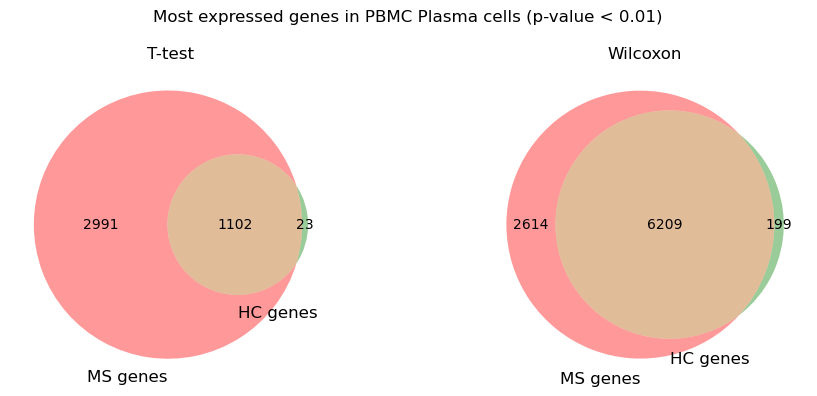

In [100]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_plasma_cells_PBMC, cell_type_name='Plasma cells', pbmc_csf='PBMC')

All write reported below are for the Wilcoxon test.

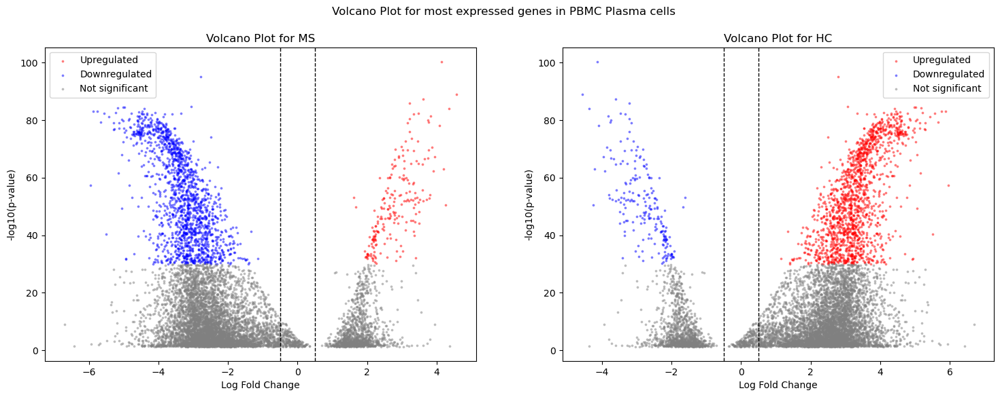

In [101]:
volcano_plot(adata_plasma_cells_PBMC, cell_type_name='Plasma cells', pbmc_csf='PBMC')

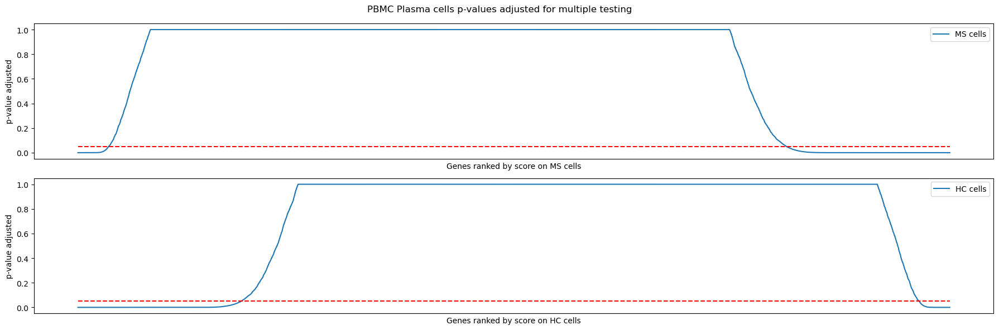

In [102]:
visualize_p_value_adj(adata_plasma_cells_PBMC, cell_type_name='Plasma cells', pbmc_csf='PBMC')

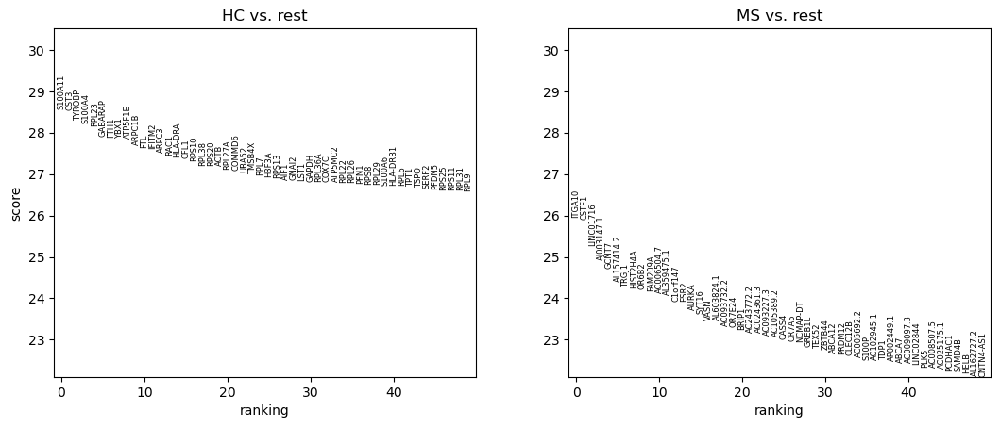

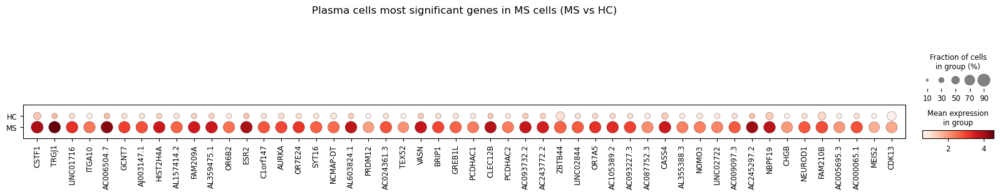

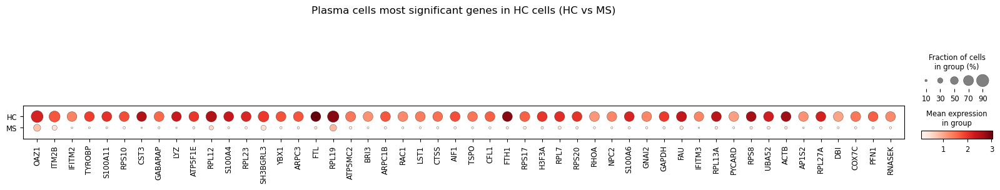

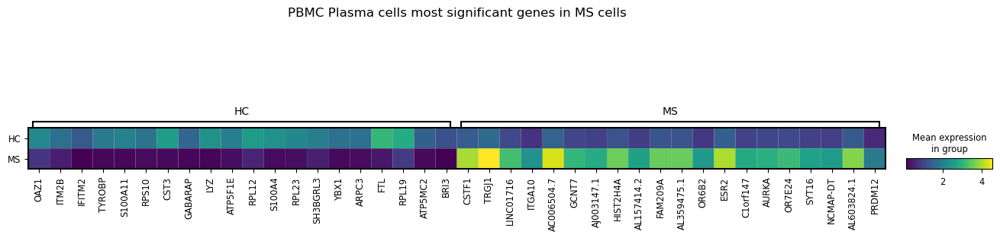

In [103]:
dotplots_and_ranking_most_significant_genes(adata_plasma_cells_PBMC, cell_type_name='Plasma cells', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



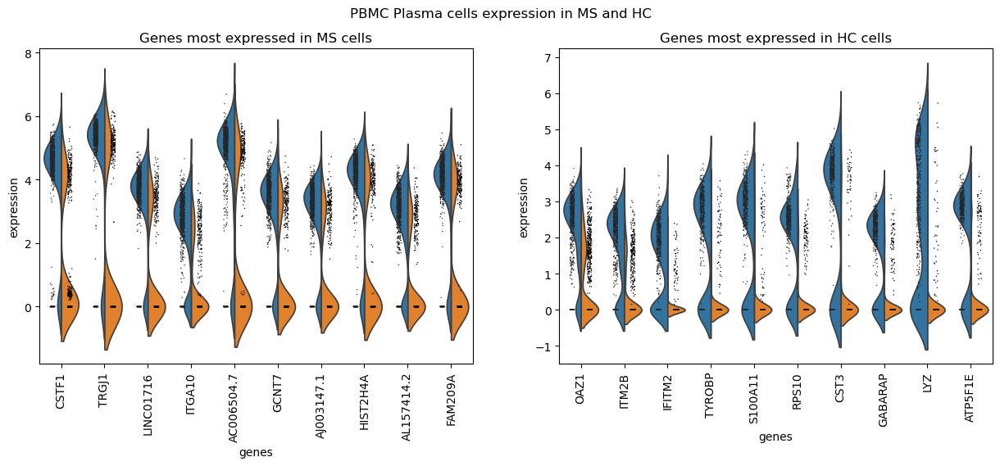

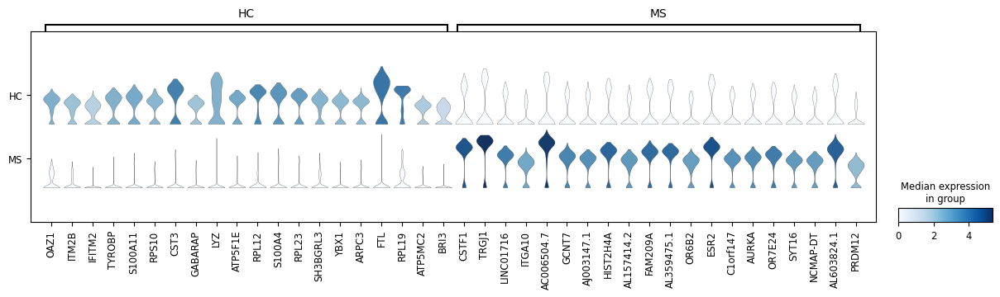

In [104]:
visualize_rank_genes_groups_violin(adata_plasma_cells_PBMC, cell_type_name='Plasma cells', pbmc_csf='PBMC')

In [105]:
sc.get.rank_genes_groups_df(adata_plasma_cells_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,7533.000000,7533.000000,7.533000e+03,7.533000e+03
mean,6.264738,1.971217,9.310918e-05,4.908813e-04
std,7.249469,1.860277,2.976436e-04,1.532681e-03
min,-21.823313,-4.568410,1.393867e-105,5.288889e-101
25%,3.909757,1.526263,3.522919e-29,7.091440e-28
50%,6.440254,2.556300,8.241763e-13,8.301711e-12
75%,10.555650,3.137310,2.104073e-06,1.413043e-05
max,21.232075,6.699833,1.981204e-03,9.979398e-03


In [106]:
sum(adata_plasma_cells_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_plasma_cells_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.19852941176470587

In [107]:
sc.get.rank_genes_groups_df(adata_plasma_cells_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,7533.000000,7533.000000,7.533000e+03,7.533000e+03
mean,-6.264738,-1.971217,9.310918e-05,4.908813e-04
std,7.249469,1.860277,2.976436e-04,1.532681e-03
min,-21.232075,-6.699833,1.393867e-105,5.288889e-101
25%,-10.555650,-3.137310,3.522919e-29,7.091440e-28
50%,-6.440254,-2.556300,8.241763e-13,8.301711e-12
75%,-3.909757,-1.526263,2.104073e-06,1.413043e-05
max,21.823313,4.568410,1.981204e-03,9.979398e-03


In [108]:
sum(adata_plasma_cells_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_plasma_cells_PBMC.uns[
    'wilcoxon']['pvals_adj']['MS'])

0.19852941176470587

#### Plasma cells CSF

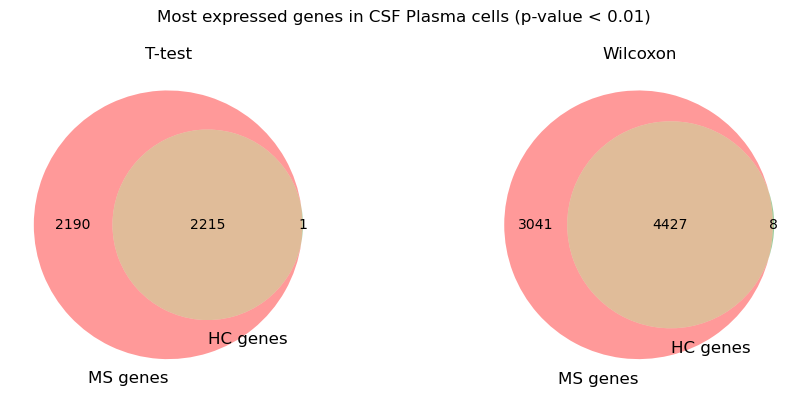

In [109]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_plasma_cells_CSF, cell_type_name='Plasma cells', pbmc_csf='CSF')

All write reported below are for the Wilcoxon test.

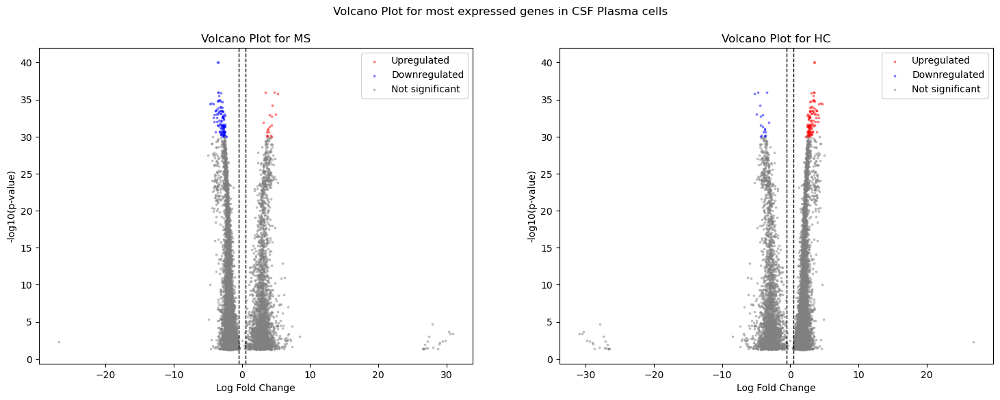

In [110]:
volcano_plot(adata_plasma_cells_CSF, cell_type_name='Plasma cells', pbmc_csf='CSF')

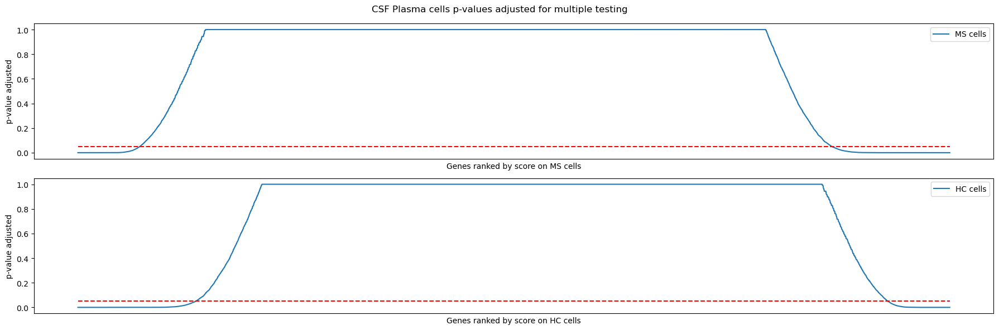

In [111]:
visualize_p_value_adj(adata_plasma_cells_CSF, cell_type_name='Plasma cells', pbmc_csf='CSF')

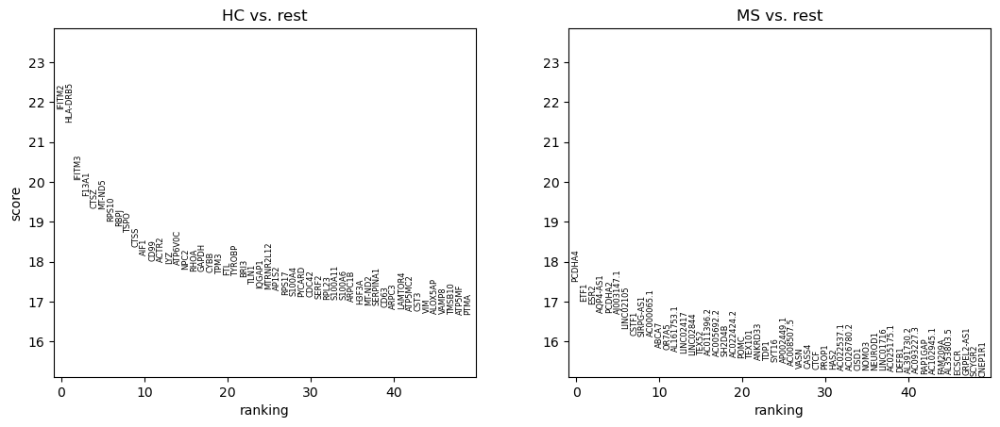

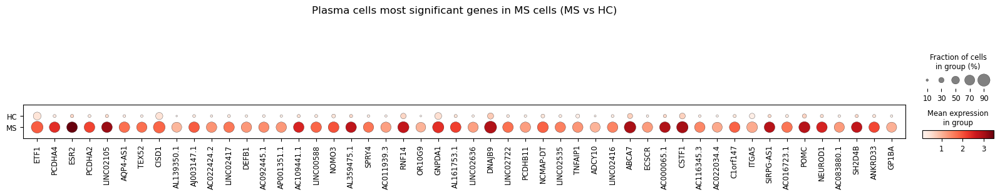

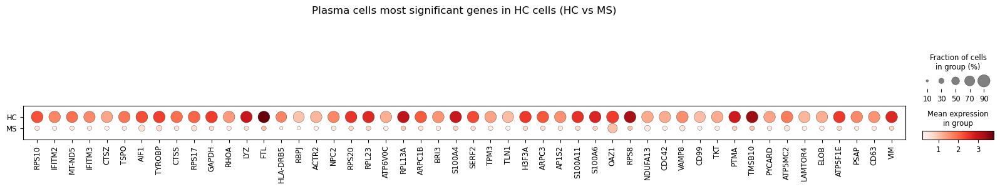

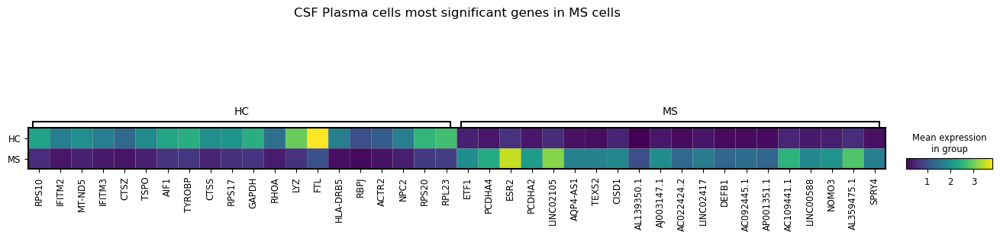

In [112]:
dotplots_and_ranking_most_significant_genes(adata_plasma_cells_CSF, cell_type_name='Plasma cells', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



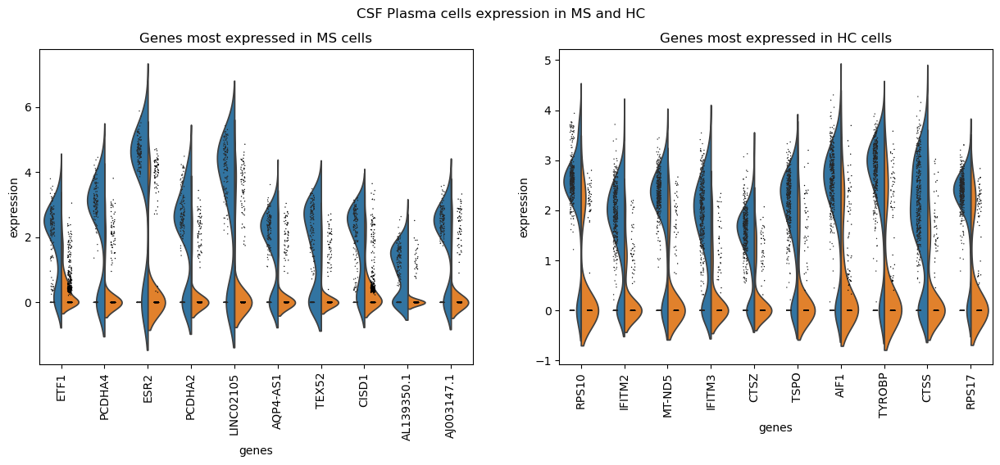

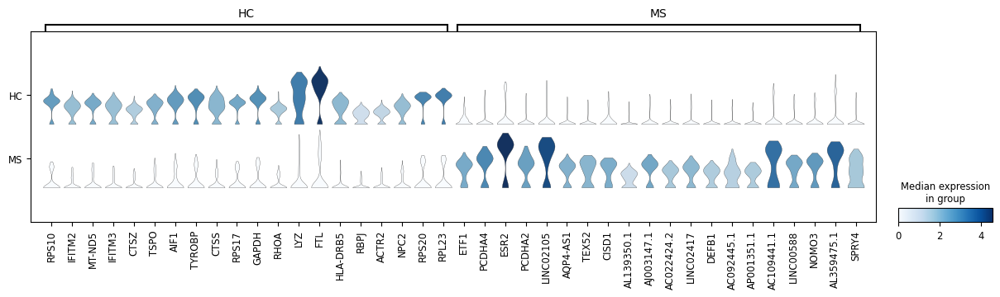

In [113]:
visualize_rank_genes_groups_violin(adata_plasma_cells_CSF, cell_type_name='Plasma cells', pbmc_csf='CSF')

In [114]:
sc.get.rank_genes_groups_df(adata_plasma_cells_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,6651.000000,6651.000000,6.651000e+03,6.651000e+03
mean,2.305722,0.317913,1.202217e-04,7.329087e-04
std,6.528197,2.747263,3.159151e-04,1.858796e-03
min,-13.317091,-30.915199,2.296479e-45,8.713759e-41
25%,-4.060548,-2.514014,1.088956e-16,2.483879e-15
50%,4.280162,1.704229,1.117012e-08,1.274321e-07
75%,6.988333,2.145000,2.684614e-05,2.041996e-04
max,14.135454,26.823830,1.749182e-03,9.979098e-03


In [115]:
sum(adata_plasma_cells_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_plasma_cells_CSF.uns['wilcoxon']['pvals_adj']['HC'])

0.17528462998102468

In [116]:
sc.get.rank_genes_groups_df(adata_plasma_cells_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,6651.000000,6651.000000,6.651000e+03,6.651000e+03
mean,-2.305722,-0.317913,1.202217e-04,7.329087e-04
std,6.528197,2.747263,3.159151e-04,1.858796e-03
min,-14.135454,-26.823830,2.296479e-45,8.713759e-41
25%,-6.988333,-2.145000,1.088956e-16,2.483879e-15
50%,-4.280162,-1.704229,1.117012e-08,1.274321e-07
75%,4.060548,2.514014,2.684614e-05,2.041996e-04
max,13.317091,30.915199,1.749182e-03,9.979098e-03


In [117]:
sum(adata_plasma_cells_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_plasma_cells_CSF.uns[
    'wilcoxon']['pvals_adj']['MS'])

0.17528462998102468

### HSC/MPP

In [118]:
if os.path.exists('write/HSC_MPP_PBMC.h5ad'):
    adata_HSC_MPP_PBMC = sc.read('write/HSC_MPP_PBMC.h5ad')
    adata_HSC_MPP_CSF = sc.read('write/HSC_MPP_CSF.h5ad')
else:
    adata_HSC_MPP = adata[adata.obs['cell_types_labels']=='HSC/MPP']
    adata_HSC_MPP_PBMC, adata_HSC_MPP_CSF = compute_rank_genes_group(adata_HSC_MPP)
    adata_HSC_MPP_PBMC.write('write/HSC_MPP_PBMC.h5ad')
    adata_HSC_MPP_CSF.write('write/HSC_MPP_CSF.h5ad')

In [119]:
adata_HSC_MPP_PBMC

AnnData object with n_obs × n_vars = 95 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [120]:
adata_HSC_MPP_CSF

AnnData object with n_obs × n_vars = 26 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### HSC/MPP PBMC

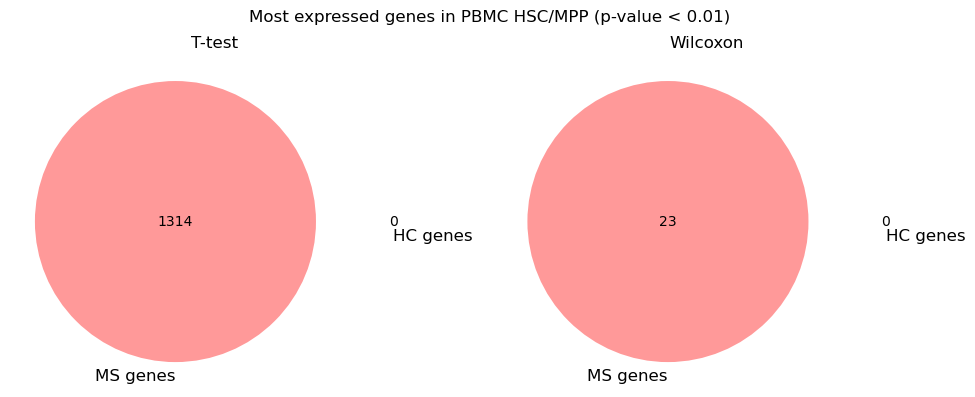

In [121]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_HSC_MPP_PBMC, cell_type_name='HSC/MPP', pbmc_csf='PBMC')

All write reported below are for the Wilcoxon test.

In [122]:
#volcano_plot(adata_HSC_MPP_PBMC, cell_type_name='HSC/MPP', pbmc_csf='PBMC')

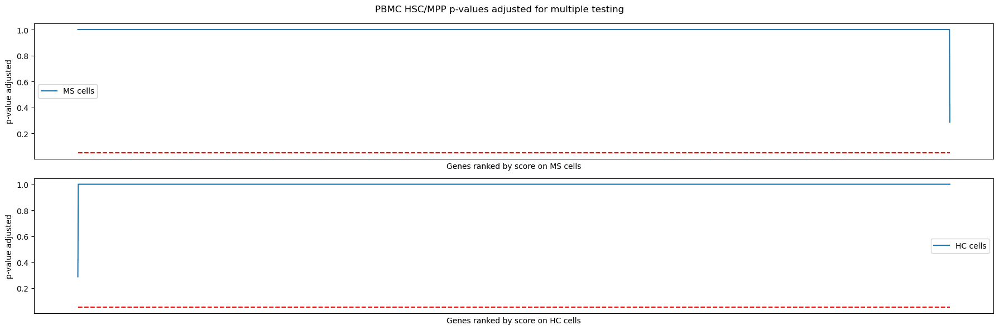

In [123]:
visualize_p_value_adj(adata_HSC_MPP_PBMC, cell_type_name='HSC/MPP', pbmc_csf='PBMC')

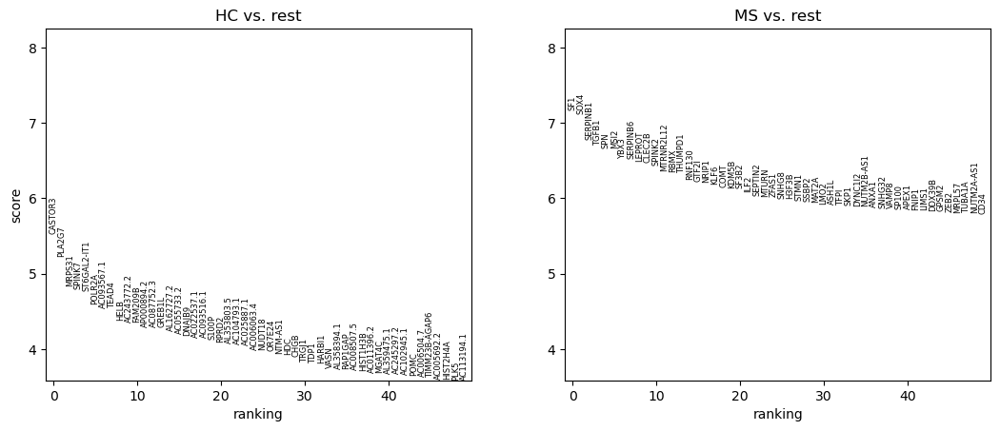

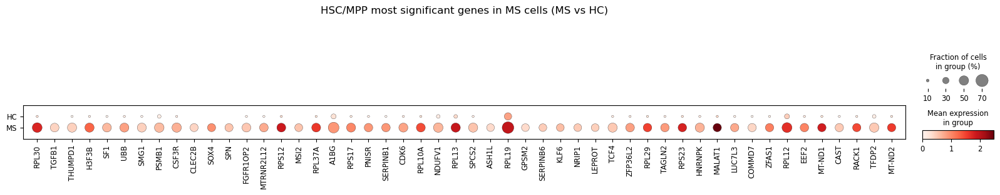

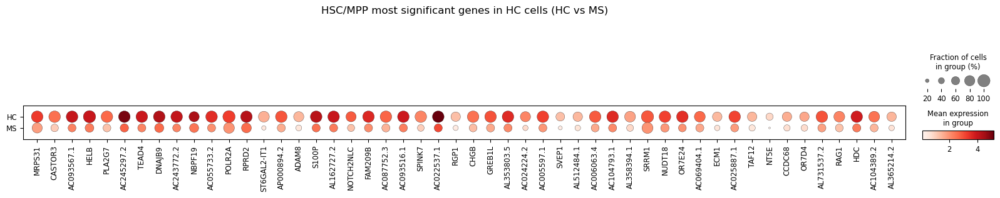

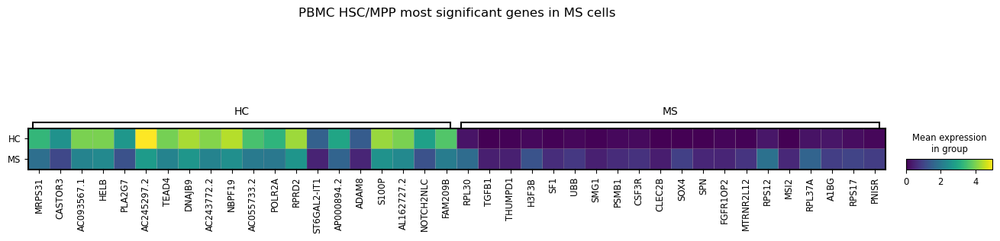

In [124]:
dotplots_and_ranking_most_significant_genes(adata_HSC_MPP_PBMC, cell_type_name='HSC/MPP', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



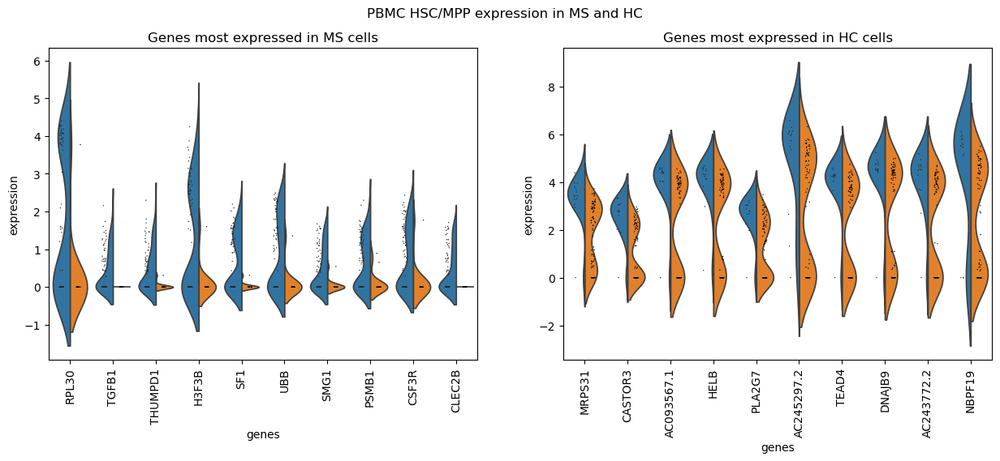

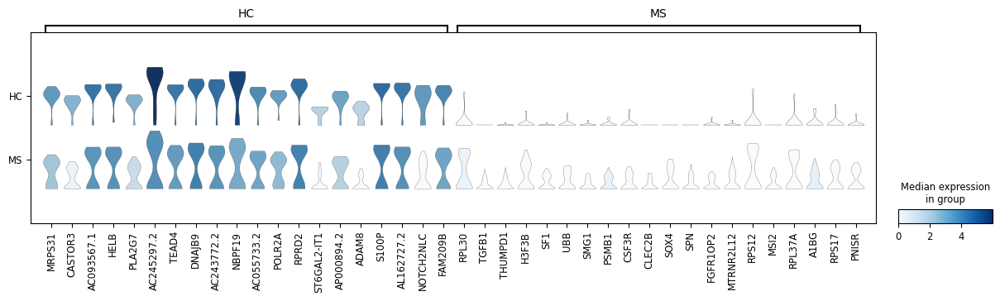

In [125]:
visualize_rank_genes_groups_violin(adata_HSC_MPP_PBMC, cell_type_name='HSC/MPP', pbmc_csf='PBMC')

In [126]:
sc.get.rank_genes_groups_df(adata_HSC_MPP_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


In [127]:
sum(adata_HSC_MPP_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_HSC_MPP_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.0

In [128]:
sc.get.rank_genes_groups_df(adata_HSC_MPP_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


In [129]:
sum(adata_HSC_MPP_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_HSC_MPP_PBMC.uns['wilcoxon']['pvals_adj']['MS'])

0.0

#### HSC/MPP CSF

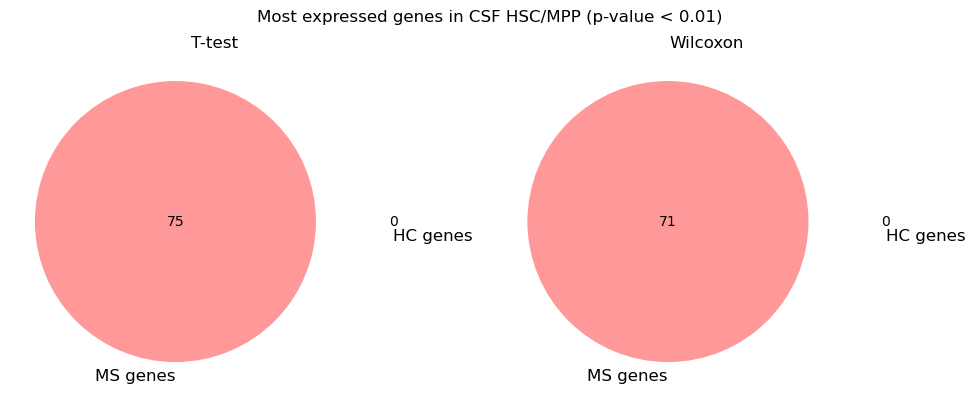

In [130]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_HSC_MPP_CSF, cell_type_name='HSC/MPP', pbmc_csf='CSF')

All write reported below are for the Wilcoxon test.

In [131]:
#volcano_plot(adata_HSC_MPP_CSF, cell_type_name='HSC/MPP', pbmc_csf='CSF')

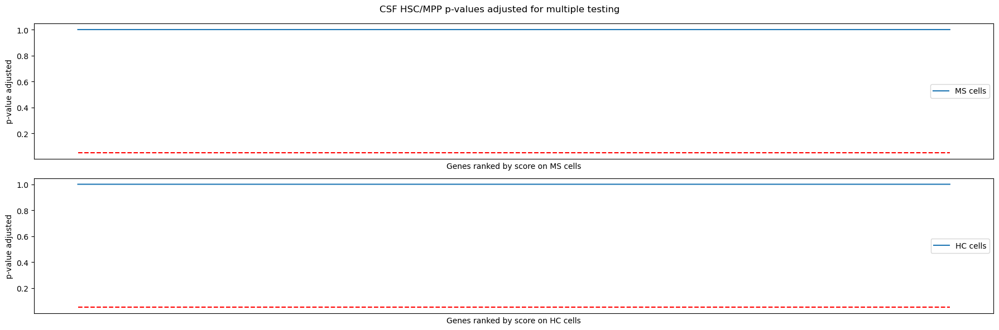

In [132]:
visualize_p_value_adj(adata_HSC_MPP_CSF, cell_type_name='HSC/MPP', pbmc_csf='CSF')

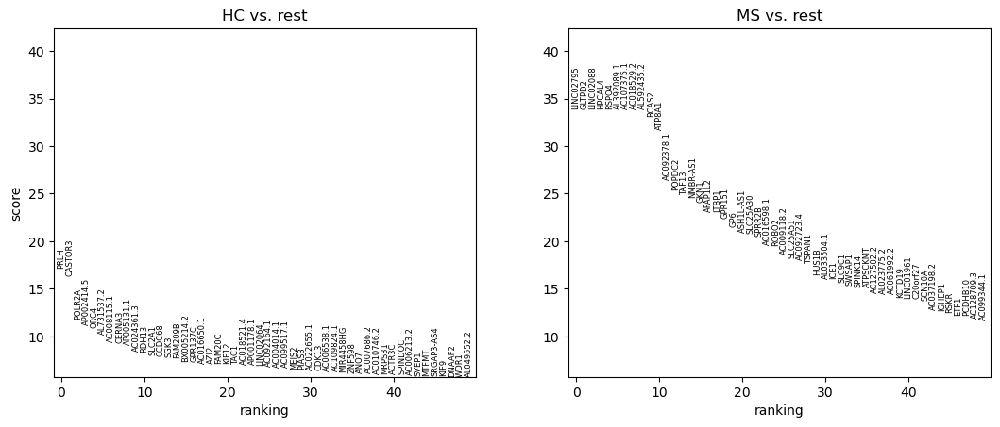

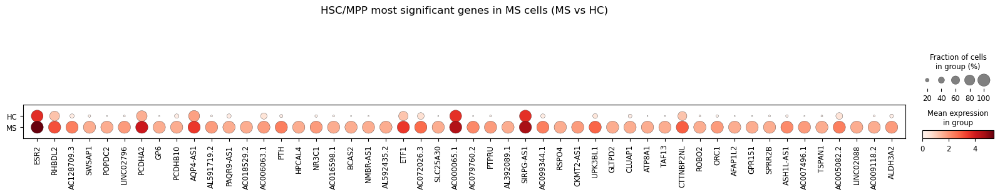

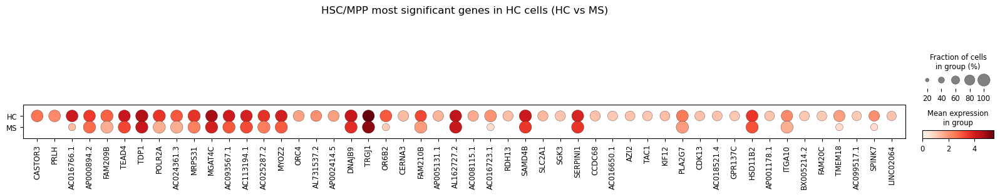

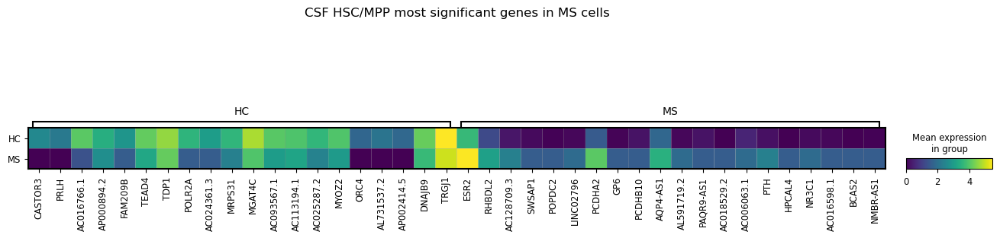

In [133]:
dotplots_and_ranking_most_significant_genes(adata_HSC_MPP_CSF, cell_type_name='HSC/MPP', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



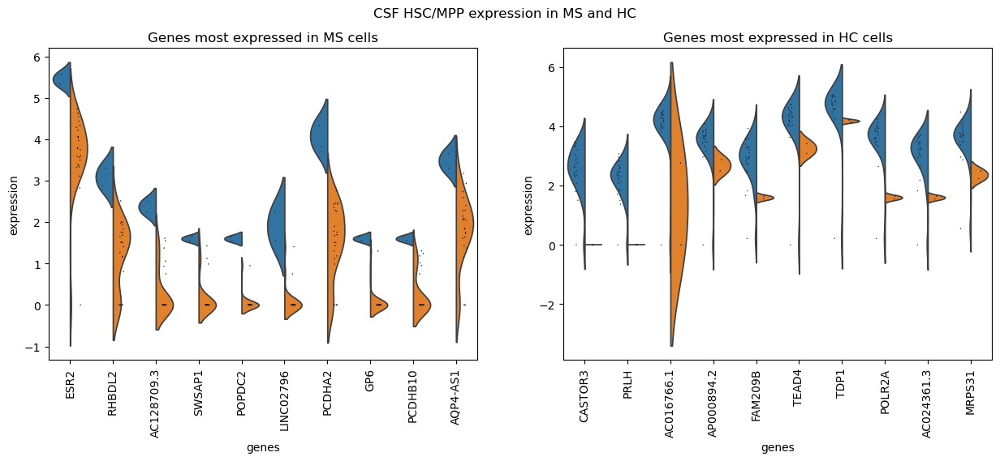

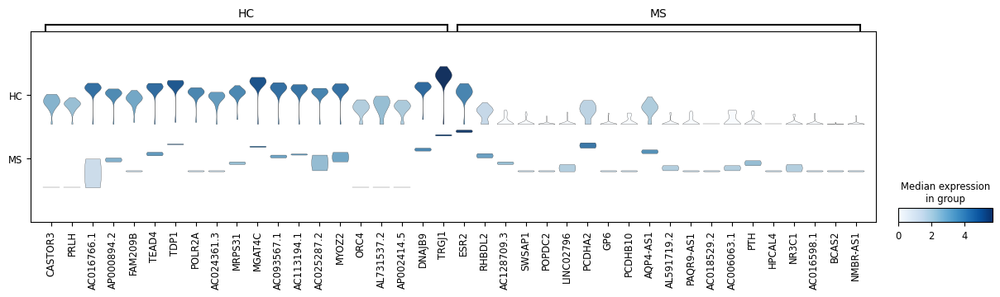

In [134]:
visualize_rank_genes_groups_violin(adata_HSC_MPP_CSF, cell_type_name='HSC/MPP', pbmc_csf='CSF')

In [135]:
sc.get.rank_genes_groups_df(adata_HSC_MPP_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


In [136]:
sum(adata_HSC_MPP_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_HSC_MPP_CSF.uns['wilcoxon']['pvals_adj']['HC'])

0.0

In [137]:
sc.get.rank_genes_groups_df(adata_HSC_MPP_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


In [138]:
sum(adata_HSC_MPP_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_HSC_MPP_CSF.uns['wilcoxon']['pvals_adj']['MS'])

0.0

### DC

In [139]:
if os.path.exists('write/DC_PBMC.h5ad'):
    adata_DC_PBMC = sc.read('write/DC_PBMC.h5ad')
    adata_DC_CSF = sc.read('write/DC_CSF.h5ad')
else:
    adata_DC = adata[adata.obs['cell_types_labels']=='DC']
    adata_DC_PBMC, adata_DC_CSF = compute_rank_genes_group(adata_DC)
    adata_DC_PBMC.write('write/DC_PBMC.h5ad')
    adata_DC_CSF.write('write/DC_CSF.h5ad')

In [140]:
adata_DC_PBMC

AnnData object with n_obs × n_vars = 225 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

In [141]:
adata_DC_CSF

AnnData object with n_obs × n_vars = 44 × 37944
    obs: 'dataset', 'disease', 'cell_type', 'sample', 'patient_id', 'time', 'cell_types_labels', 'patient', 'MS/HC'
    var: 'gene_ids', 'feature_types'
    uns: 'log1p', 'rank_genes_groups', 't-test', 'wilcoxon'

#### DC PBMC

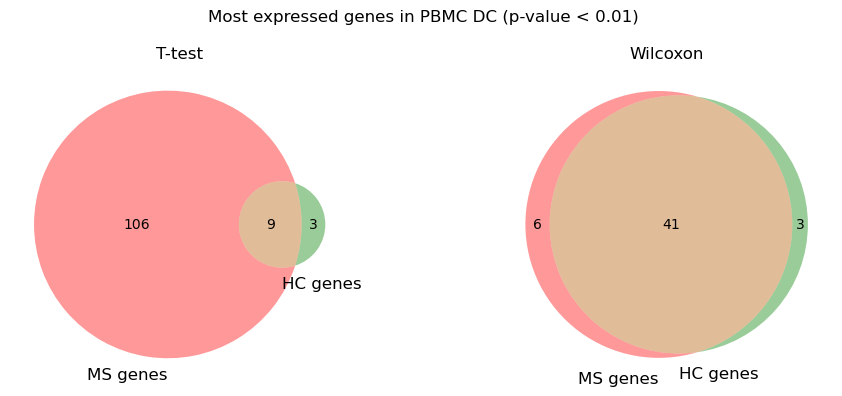

In [142]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_DC_PBMC, cell_type_name='DC', pbmc_csf='PBMC')

All write reported below are for the Wilcoxon test.

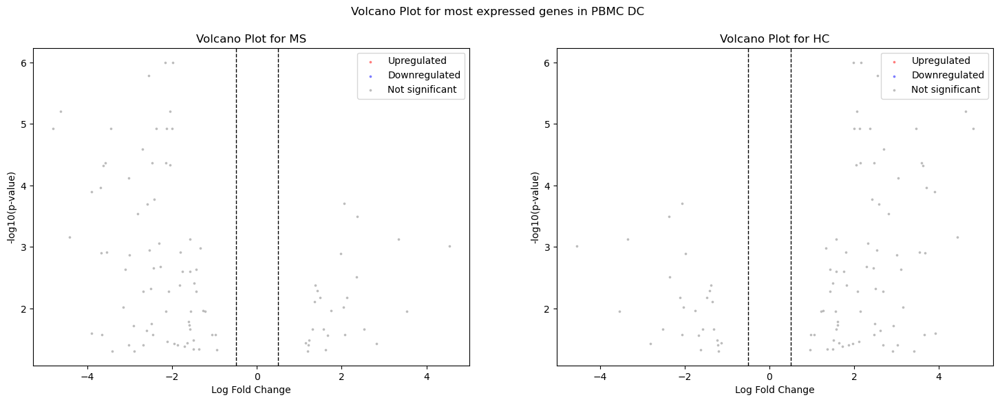

In [143]:
volcano_plot(adata_DC_PBMC, cell_type_name='DC', pbmc_csf='PBMC')

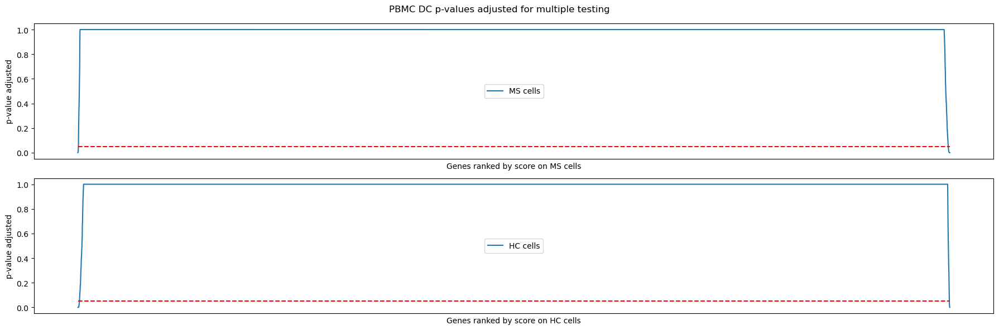

In [144]:
visualize_p_value_adj(adata_DC_PBMC, cell_type_name='DC', pbmc_csf='PBMC')

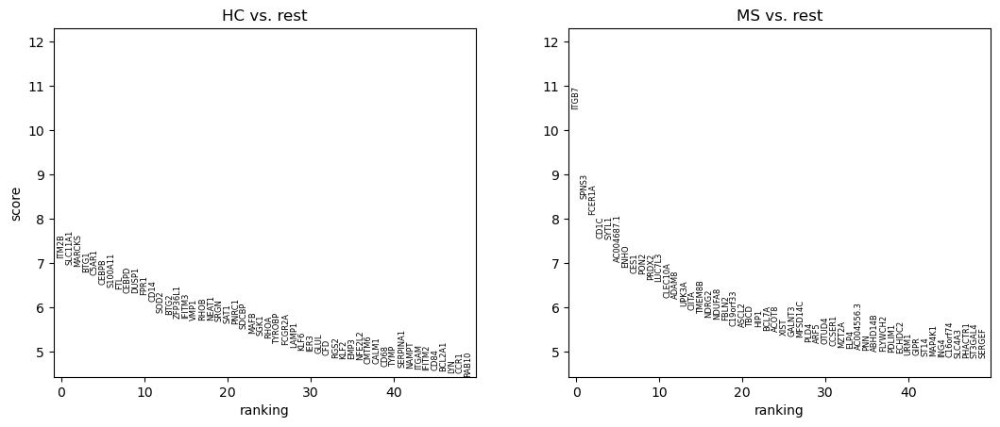

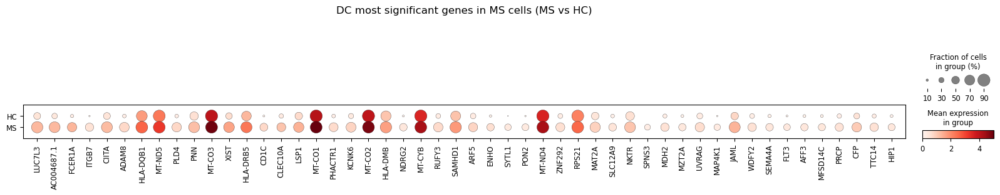

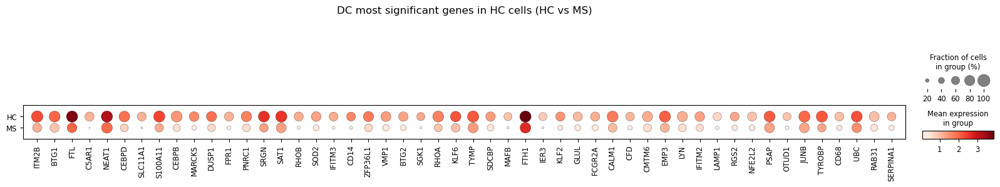

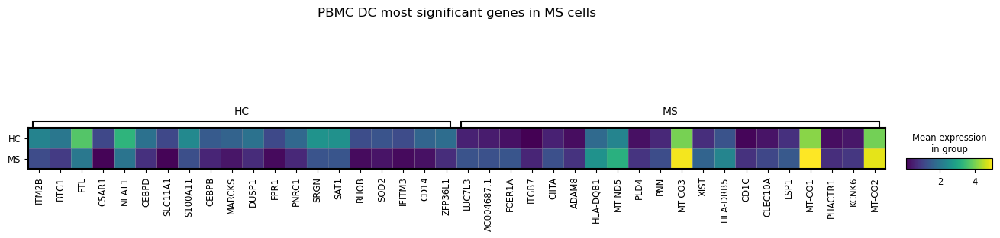

In [145]:
dotplots_and_ranking_most_significant_genes(adata_DC_PBMC, cell_type_name='DC', pbmc_csf='PBMC')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



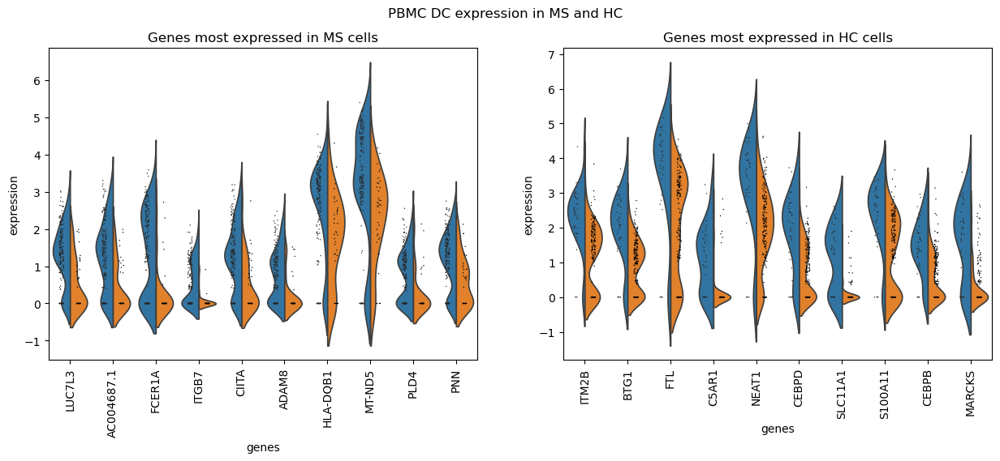

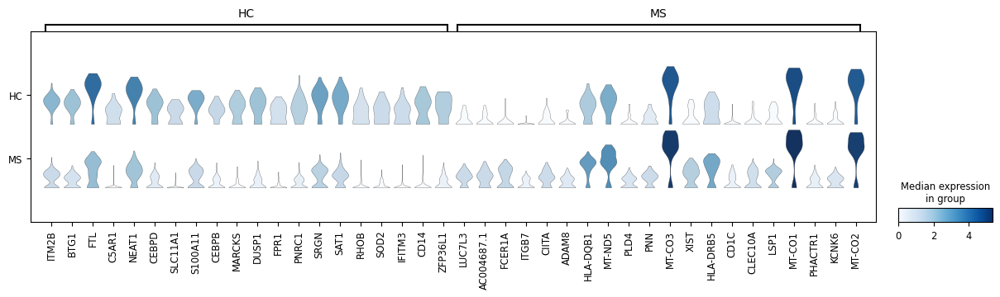

In [146]:
visualize_rank_genes_groups_violin(adata_DC_PBMC, cell_type_name='DC', pbmc_csf='PBMC')

In [147]:
sc.get.rank_genes_groups_df(adata_DC_PBMC, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,56.000000,56.000000,5.600000e+01,5.600000e+01
mean,3.131844,1.585268,2.407778e-06,1.954840e-03
std,4.178074,2.181792,3.610632e-06,2.547017e-03
min,-5.313982,-4.548918,3.711954e-11,9.991302e-07
25%,4.490848,1.432162,1.762125e-08,4.529289e-05
50%,4.882084,2.155745,6.918887e-07,9.203059e-04
75%,5.634147,2.859109,2.967254e-06,2.662417e-03
max,6.615142,4.813934,1.419357e-05,9.617157e-03


In [148]:
sum(adata_DC_PBMC.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_DC_PBMC.uns['wilcoxon']['pvals_adj']['HC'])

0.0014758591608686486

In [149]:
sc.get.rank_genes_groups_df(adata_DC_PBMC, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,56.000000,56.000000,5.600000e+01,5.600000e+01
mean,-3.131844,-1.585268,2.407778e-06,1.954840e-03
std,4.178074,2.181792,3.610632e-06,2.547017e-03
min,-6.615142,-4.813934,3.711954e-11,9.991302e-07
25%,-5.634147,-2.859109,1.762125e-08,4.529289e-05
50%,-4.882084,-2.155745,6.918887e-07,9.203059e-04
75%,-4.490848,-1.432162,2.967254e-06,2.662417e-03
max,5.313982,4.548918,1.419357e-05,9.617157e-03


In [150]:
sum(adata_DC_PBMC.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_DC_PBMC.uns['wilcoxon']['pvals_adj']['MS'])

0.0014758591608686486

#### DC CSF

c:\Users\giuli\anaconda3\lib\site-packages\matplotlib_venn\_venn2.py:50: UserWarning:

Both circles have zero area



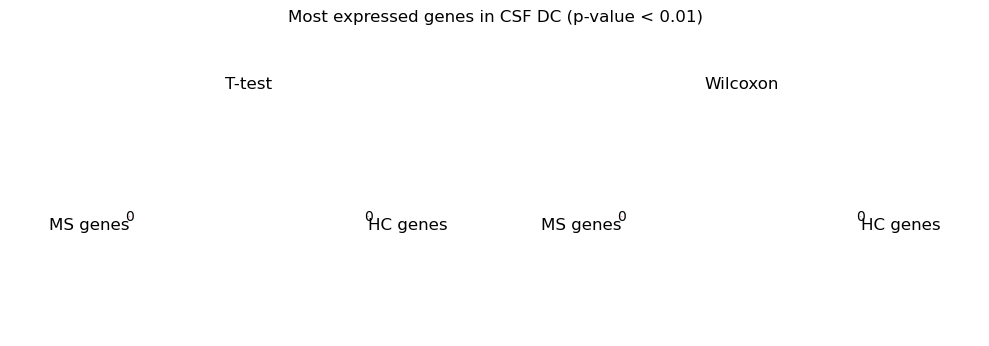

In [151]:
visualize_venn_diagram_ttest_vs_wilcoxon(adata_DC_CSF, cell_type_name='DC', pbmc_csf='CSF')

All write reported below are for the Wilcoxon test.

In [152]:
#volcano_plot(adata_DC_CSF, cell_type_name='DC', pbmc_csf='CSF')

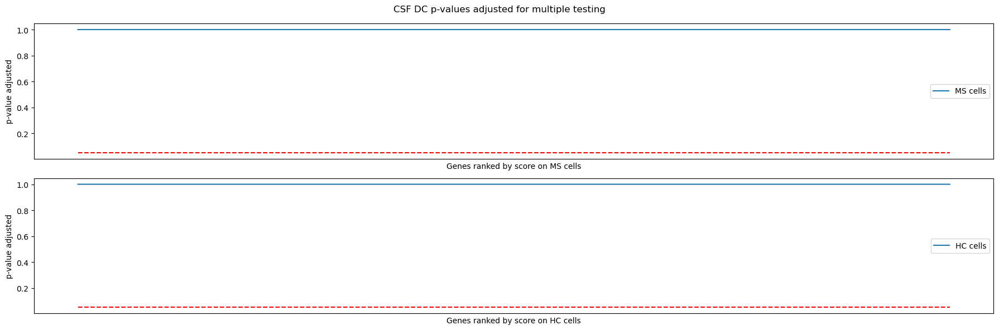

In [153]:
visualize_p_value_adj(adata_DC_CSF, cell_type_name='DC', pbmc_csf='CSF')

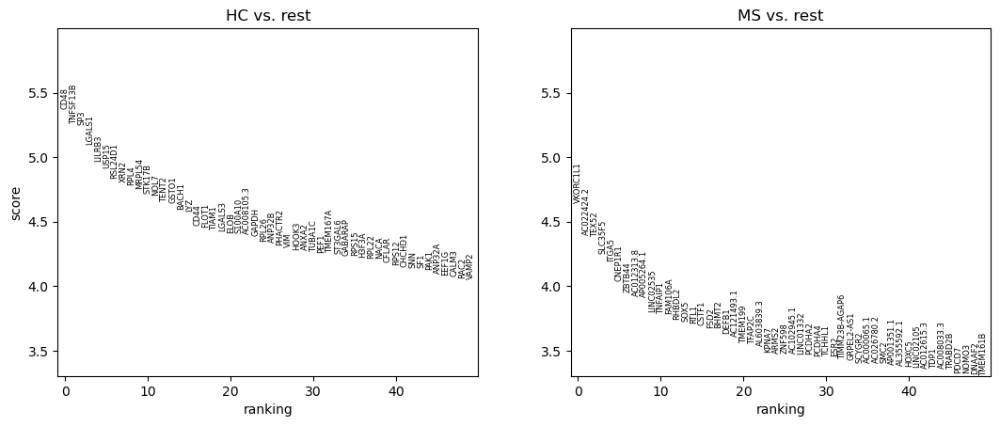

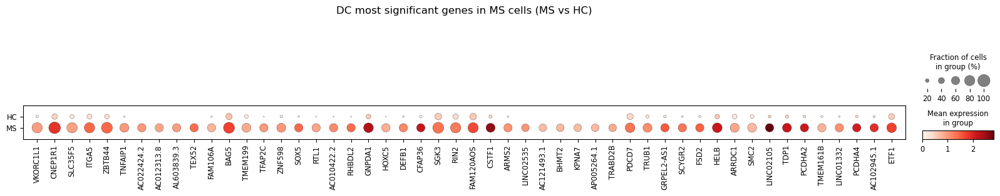

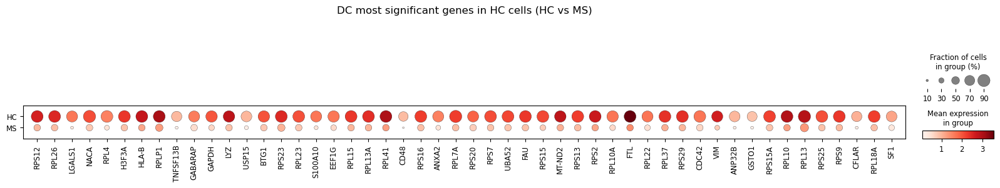

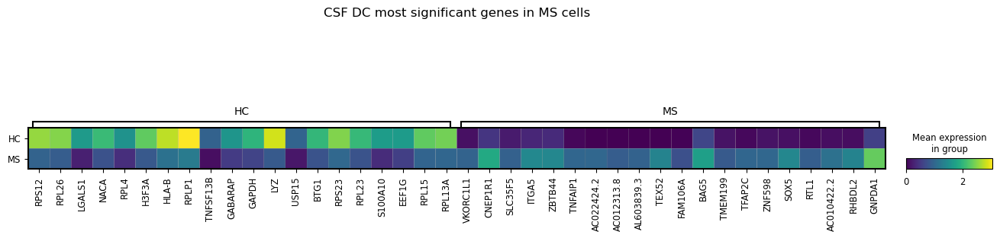

In [154]:
dotplots_and_ranking_most_significant_genes(adata_DC_CSF, cell_type_name='DC', pbmc_csf='CSF')

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator

c:\Users\giuli\anaconda3\lib\site-packages\scanpy\plotting\_tools\__init__.py:1303: UserWarning:

FixedFormatter should only be used together with FixedLocator



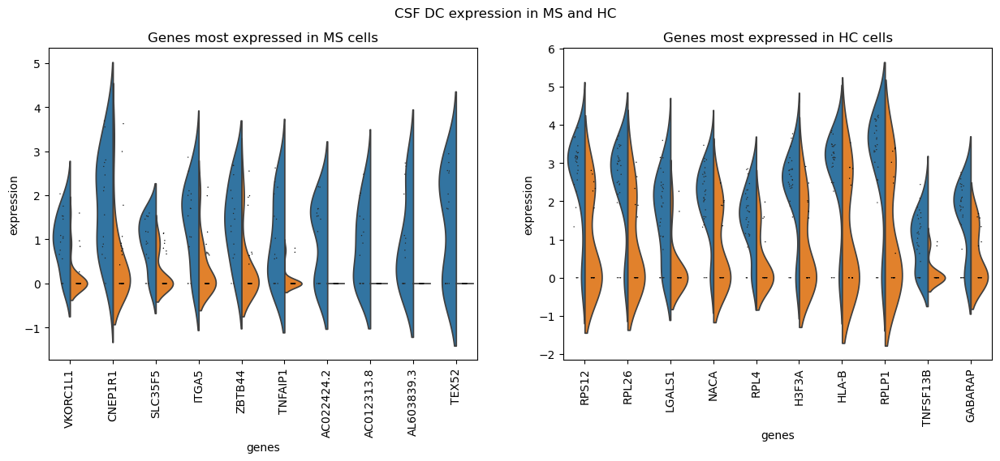

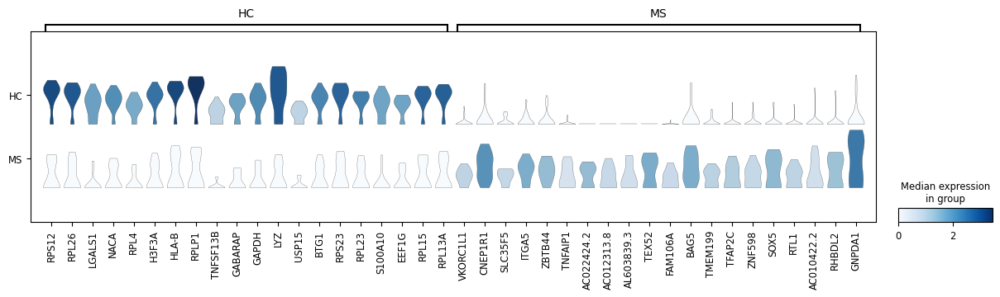

In [155]:
visualize_rank_genes_groups_violin(adata_DC_CSF, cell_type_name='DC', pbmc_csf='CSF')

In [156]:
sc.get.rank_genes_groups_df(adata_DC_CSF, group='HC', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


In [157]:
sum(adata_DC_CSF.uns['wilcoxon']['pvals_adj']['HC'] < 0.01) / len(adata_DC_CSF.uns['wilcoxon']['pvals_adj']['HC'])

0.0

In [158]:
sc.get.rank_genes_groups_df(adata_DC_CSF, group='MS', key='wilcoxon', pval_cutoff=0.01).describe()

,scores,logfoldchanges,pvals,pvals_adj
count,0.0,0.0,0.0,0.0
mean,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN
max,NaN,NaN,NaN,NaN


In [159]:
sum(adata_DC_CSF.uns['wilcoxon']['pvals_adj']['MS'] < 0.01) / len(adata_DC_CSF.uns['wilcoxon']['pvals_adj']['MS'])

0.0